# Supervised Learning - Classification Project

In [1]:
# Importing the required libraries 

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings('ignore') # for ignoring the warings in the notebook

In [2]:
# Setting up the color pallet for the visulaization

my_pallet = ["#3498db","#9b59b6","#95a5a6","#e74c3c","#34495e","#2ecc71"]
sns.set_palette(my_pallet)

In [3]:
# This is to enlarge the width of the Juypter notebook for better visual experience
from IPython.core.display import display, HTML
display(HTML("<style>.container {width:80% !important;}</style>"))

# Making the visual more clear and increase the default size of any plot
matplotlib.rcParams['figure.figsize'] = (13,8)
matplotlib.rcParams['lines.linewidth'] = 2

%config InlineBackend.figure_format = 'retina'# for high resolution of the plots

In [4]:
# Creating a function for intital data analysis and find the characterstics of the givne dataset

#importing the dataset

training_df=pd.read_csv('train.csv')
testing_df=pd.read_csv('test.csv')

# Creating a function for initial analysis

def initial_analysis(dataset):
    
    
    """
    This function is used perform priliminary analysis on the dataset and tell us about the shape, numerical variables,
    categorical variables, missing values and duplicates in each variables.
    
    """
    
    #shape of the dataset
    
    print("\n The shape of the dataset:{}".format(dataset.shape))
    print("\n Number of columns in the dataset:{}".format(dataset.shape[1]))
    print("\n Number of rows in the dataset:{}".format(dataset.shape[0]))
    print("*"*45)
    
    # Numerical and Categorical feautres in the dataset
    
    numeric_features = dataset.select_dtypes(include = [np.number])
    categoric_features = dataset.select_dtypes(exclude = [np.number])
    print(" Number of Numerical Features : {}".format(numeric_features.shape[1]))
    print("\n Number of Categorical Features : {}".format(categoric_features.shape[1]))
    print("*"*40)
    
    # Missing values
    print(" Number of missing values :\n \n{}".format(dataset.isna().sum()))
    print("*"*40)
    
    # Checking the duplicates
    print("\n**The dataset has {} duplicate rows.**".format(dataset.duplicated().sum()))

In [5]:
# For displaying the full dataset in the jupyter notebook
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# calling function for initial analysis of the dataset
initial_analysis(training_df)


 The shape of the dataset:(40000, 101)

 Number of columns in the dataset:101

 Number of rows in the dataset:40000
*********************************************
 Number of Numerical Features : 95

 Number of Categorical Features : 6
****************************************
 Number of missing values :
 
x0     14
x1     10
x2      6
x3     10
x4      6
x5     10
x6      7
x7     13
x8      6
x9      7
x10     8
x11     9
x12    11
x13    13
x14     3
x15     8
x16     8
x17    11
x18    14
x19     8
x20     6
x21    13
x22     5
x23     9
x24    11
x25     8
x26    11
x27     8
x28    11
x29     5
x30     5
x31     8
x32     4
x33     9
x34     7
x35    10
x36     7
x37     3
x38     6
x39     8
x40     6
x41     5
x42    12
x43     1
x44     4
x45     5
x46     7
x47     4
x48    10
x49     6
x50     5
x51    11
x52     8
x53     4
x54     6
x55    14
x56    11
x57     8
x58     7
x59     9
x60    12
x61     6
x62    13
x63    13
x64     5
x65    12
x66    10
x67     8
x68     9
x69 

In [49]:
training_df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x34,x35,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x68,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x93,x94,x95,x96,x97,x98,x99,y
0,10.142889,-15.675620,3.583176,-22.397489,27.221894,-34.110924,-0.072829,-0.544444,0.997601,-2.691778,-0.923879,8.109456,27.872550,-3.420582,1.511710,6.673493,-4.323289,-1.538177,12.853393,-23.583975,-26.410490,2.328126,-28.226474,-4.131820,0.268103,-5.661808,-2.782330,30.276359,-0.944980,0.277266,-2.233740,0.515763,0.004137,-27.321975,bmw,wed,5.613605,-8.771422,1.012030,-2.122949,0.500782,-54.10,-60.377200,-14.343129,-38.244485,0.00,-8.346880,0.300698,-3.560418,-29.858649,-0.004122,-1.034268,2.280323,-9.220175,-0.672959,-1.352266,19.547038,-6.706483,-16.123533,-5.271198,0.099280,-4.905632,0.557732,-3.858105,-0.074825,-11.258499,-44.973467,-4.274642,Jun,20.093447,8.887374,-0.061831,-23.493130,-14.127448,10.601780,-14.699572,0.105456,-7.410651,7.077637,-15.406388,-8.077094,0.099309,8.897077,16.018401,3.156413,9.127295,2.508565,0.298215,-1.502183,-10.945135,-151.134483,1.916575,5.240820,euorpe,2.431170,0.454074,-18.572032,-14.291524,0.178579,18.110170,0
1,-52.214630,5.847135,-10.902843,-14.132351,20.588574,36.107322,0.115023,0.276093,-0.699168,-0.972708,1.287131,5.717183,-3.761334,-5.074973,-1.296964,-2.366536,-19.532219,-0.651274,-0.758730,-5.580162,47.151801,2.053410,-4.348193,-17.632414,-3.963233,-27.385429,1.991331,25.995571,-1.390032,-0.791795,2.537591,-1.138456,-1.202222,48.491336,nissan,thur,-2.132043,1.288928,-1.622637,-0.919865,9.054563,-229.32,-280.208298,-46.045485,-7.783574,0.01,-2.248960,15.868349,-2.320347,29.611460,0.035378,-9.960903,0.662594,-40.051587,-7.467978,0.150334,13.798547,-19.627385,-28.046366,-8.330669,0.014509,-3.445528,0.109443,-4.855778,0.193892,4.110659,-93.785215,1.577921,July,9.645175,24.233527,-0.693696,11.269393,1.432276,2.241497,66.730645,-0.999038,-11.437920,5.797127,-24.134625,-56.489610,-0.010569,3.908027,37.616056,-2.317927,19.107566,0.254426,1.574185,-9.588623,-0.620432,-58.955871,0.370941,-3.794542,asia,2.592326,31.921833,3.317139,10.037003,-1.930870,-3.486898,0
2,67.718500,2.064334,12.394186,-18.667102,47.465504,-50.373658,0.253707,1.068968,2.939713,2.691218,3.058585,7.537863,-19.130709,-0.906646,-2.794020,-3.978507,14.237849,1.373681,9.635405,-16.183555,16.922392,1.663092,-9.758591,-13.040577,-13.865584,4.965384,0.940166,16.305724,0.112402,-1.199571,1.286813,0.277410,0.682253,-6.741030,Honda,wed,3.206642,-8.065741,0.838277,-0.465169,1.225612,243.68,-119.470071,25.462689,56.571522,-0.01,-2.161725,7.287187,-2.414766,-19.325576,0.865352,-8.971459,0.182888,25.383424,-4.359127,-0.198638,3.231385,-34.887447,-19.617867,2.782562,-0.737877,21.776265,-0.074349,0.956671,0.351399,0.655842,21.554429,16.279894,July,-21.659163,-1.974495,0.497966,-3.910715,2.961145,6.456046,-5.291719,-1.162664,0.826614,3.589234,4.451489,41.090029,-0.589545,0.019545,39.526904,1.184955,10.352987,6.747758,-1.042833,-7.050751,-7.780230,-74.014931,1.449817,12.470532,asia,7.143821,9.401490,-10.604968,7.643215,-0.842198,-79.358236,0
3,-28.003111,8.565128,-8.592092,5.918960,-3.224154,78.315783,-0.879845,1.176889,-2.414752,0.589646,-0.906179,0.087087,25.075633,-0.834239,-0.027757,3.708857,-12.314642,2.700113,7.216934,74.438816,61.764811,-1.605895,-15.125777,5.556041,4.593257,-16.996278,-3.875344,5.064833,-1.296087,1.630619,-4.694258,-0.722119,-1.689241,-20.987787,Toyota,thur,-3.589886,4.368415,-1.045650,1.613660,-4.185118,126.15,129.270157,13.413693,115.018748,0.02,4.206076,-40.254305,0.049048,28.853906,0.263934,7.778529,3.748663,-1.119398,-13.652775,0.339680,-8.812638,14.877353,-18.611055,0.861688,1.615343,11.114677,-1.468676,-0.363571,1.527962,3.761182,43.310615,-7.075324,May,-0.785643,-7.698801,-1.216440,16.240854,14.623078,39.168353,5.41

In [6]:
# Converting the columns x41 and x45 to numeric which is right now showing as categorical variables

training_df['x41'] = training_df['x41'].str.replace('$','').astype(float)
training_df['x45'] = training_df['x45'].str.replace('%','').astype(float)

In [7]:
# Creating list of categorical variable

categorical_cols=list(training_df.select_dtypes(include=['object']))
categorical_cols

['x34', 'x35', 'x68', 'x93']

In [8]:
# Creating list of numerical variable

numerical_cols=list(training_df.select_dtypes(include=['number']))
print(numerical_cols,)

['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20', 'x21', 'x22', 'x23', 'x24', 'x25', 'x26', 'x27', 'x28', 'x29', 'x30', 'x31', 'x32', 'x33', 'x36', 'x37', 'x38', 'x39', 'x40', 'x41', 'x42', 'x43', 'x44', 'x45', 'x46', 'x47', 'x48', 'x49', 'x50', 'x51', 'x52', 'x53', 'x54', 'x55', 'x56', 'x57', 'x58', 'x59', 'x60', 'x61', 'x62', 'x63', 'x64', 'x65', 'x66', 'x67', 'x69', 'x70', 'x71', 'x72', 'x73', 'x74', 'x75', 'x76', 'x77', 'x78', 'x79', 'x80', 'x81', 'x82', 'x83', 'x84', 'x85', 'x86', 'x87', 'x88', 'x89', 'x90', 'x91', 'x92', 'x94', 'x95', 'x96', 'x97', 'x98', 'x99', 'y']


In [51]:
# Checking the categorical variables
training_df[categorical_cols].head()

,x34,x35,x68,x93
0,bmw,wed,Jun,euorpe
1,nissan,thur,July,asia
2,Honda,wed,July,asia
3,Toyota,thur,May,asia
4,bmw,thur,July,asia


In [52]:
# Checking the numerical variables
training_df[numerical_cols].head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x94,x95,x96,x97,x98,x99
0,10.142889,-15.675620,3.583176,-22.397489,27.221894,-34.110924,-0.072829,-0.544444,0.997601,-2.691778,-0.923879,8.109456,27.872550,-3.420582,1.511710,6.673493,-4.323289,-1.538177,12.853393,-23.583975,-26.410490,2.328126,-28.226474,-4.131820,0.268103,-5.661808,-2.782330,30.276359,-0.944980,0.277266,-2.233740,0.515763,0.004137,-27.321975,5.613605,-8.771422,1.012030,-2.122949,0.500782,-54.10,-60.377200,-14.343129,-38.244485,0.00,-8.346880,0.300698,-3.560418,-29.858649,-0.004122,-1.034268,2.280323,-9.220175,-0.672959,-1.352266,19.547038,-6.706483,-16.123533,-5.271198,0.099280,-4.905632,0.557732,-3.858105,-0.074825,-11.258499,-44.973467,-4.274642,20.093447,8.887374,-0.061831,-23.493130,-14.127448,10.601780,-14.699572,0.105456,-7.410651,7.077637,-15.406388,-8.077094,0.099309,8.897077,16.018401,3.156413,9.127295,2.508565,0.298215,-1.502183,-10.945135,-151.134483,1.916575,5.240820,2.431170,0.454074,-18.572032,-14.291524,0.178579,18.110170
1,-52.214630,5.847135,-10.902843,-14.132351,20.588574,36.107322,0.115023,0.276093,-0.699168,-0.972708,1.287131,5.717183,-3.761334,-5.074973,-1.296964,-2.366536,-19.532219,-0.651274,-0.758730,-5.580162,47.151801,2.053410,-4.348193,-17.632414,-3.963233,-27.385429,1.991331,25.995571,-1.390032,-0.791795,2.537591,-1.138456,-1.202222,48.491336,-2.132043,1.288928,-1.622637,-0.919865,9.054563,-229.32,-280.208298,-46.045485,-7.783574,0.01,-2.248960,15.868349,-2.320347,29.611460,0.035378,-9.960903,0.662594,-40.051587,-7.467978,0.150334,13.798547,-19.627385,-28.046366,-8.330669,0.014509,-3.445528,0.109443,-4.855778,0.193892,4.110659,-93.785215,1.577921,9.645175,24.233527,-0.693696,11.269393,1.432276,2.241497,66.730645,-0.999038,-11.437920,5.797127,-24.134625,-56.489610,-0.010569,3.908027,37.616056,-2.317927,19.107566,0.254426,1.574185,-9.588623,-0.620432,-58.955871,0.370941,-3.794542,2.592326,31.921833,3.317139,10.037003,-1.930870,-3.486898
2,67.718500,2.064334,12.394186,-18.667102,47.465504,-50.373658,0.253707,1.068968,2.939713,2.691218,3.058585,7.537863,-19.130709,-0.906646,-2.794020,-3.978507,14.237849,1.373681,9.635405,-16.183555,16.922392,1.663092,-9.758591,-13.040577,-13.865584,4.965384,0.940166,16.305724,0.112402,-1.199571,1.286813,0.277410,0.682253,-6.741030,3.206642,-8.065741,0.838277,-0.465169,1.225612,243.68,-119.470071,25.462689,56.571522,-0.01,-2.161725,7.287187,-2.414766,-19.325576,0.865352,-8.971459,0.182888,25.383424,-4.359127,-0.198638,3.231385,-34.887447,-19.617867,2.782562,-0.737877,21.776265,-0.074349,0.956671,0.351399,0.655842,21.554429,16.279894,-21.659163,-1.974495,0.497966,-3.910715,2.961145,6.456046,-5.291719,-1.162664,0.826614,3.589234,4.451489,41.090029,-0.589545,0.019545,39.526904,1.184955,10.352987,6.747758,-1.042833,-7.050751,-7.780230,-74.014931,1.449817,12.470532,7.143821,9.401490,-10.604968,7.643215,-0.842198,-79.358236
3,-28.003111,8.565128,-8.592092,5.918960,-3.224154,78.315783,-0.879845,1.176889,-2.414752,0.589646,-0.906179,0.087087,25.075633,-0.834239,-0.027757,3.708857,-12.314642,2.700113,7.216934,74.438816,61.764811,-1.605895,-15.125777,5.556041,4.593257,-16.996278,-3.875344,5.064833,-1.296087,1.630619,-4.694258,-0.722119,-1.689241,-20.987787,-3.589886,4.368415,-1.045650,1.613660,-4.185118,126.15,129.270157,13.413693,115.018748,0.02,4.206076,-40.254305,0.049048,28.853906,0.263934,7.778529,3.748663,-1.119398,-13.652775,0.339680,-8.812638,14.877353,-18.611055,0.861688,1.615343,11.114677,-1.468676,-0.363571,1.527962,3.761182,43.310615,-7.075324,-0.785643,-7.698801,-1.216440,16.240854,14.623078,39.168353,5.417055,-0.789563,-12.464337,0.592219,6.482230,48.559408,-0.423049,-2.152232,-0.781164,2.811031,-16.8035

## Data Cleaning

In [50]:
def handling_missing_value(dataset):
    
    """
    This function is used to impute the missing values in dataset
    by imputing mean for numerical variables and mode for categorical variables
    
    """
    numeric_features = dataset.select_dtypes(include = [np.number])
    categorical_features=dataset.select_dtypes(include=['object'])
    
    for i in categorical_features:
        dataset[i]=dataset[i].fillna(dataset[i].mode().iloc[0])
    for j in numeric_features:
        dataset[j]=dataset[j].fillna(dataset[j].mean())
    print(" Number of missing values :\n \n{}".format(dataset.isna().sum()))

In [15]:
# Calling the function for handeling the missing values

handling_missing_value(training_df)

 Number of missing values :
 
x0     0
x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
x13    0
x14    0
x15    0
x16    0
x17    0
x18    0
x19    0
x20    0
x21    0
x22    0
x23    0
x24    0
x25    0
x26    0
x27    0
x28    0
x29    0
x30    0
x31    0
x32    0
x33    0
x34    0
x35    0
x36    0
x37    0
x38    0
x39    0
x40    0
x41    0
x42    0
x43    0
x44    0
x45    0
x46    0
x47    0
x48    0
x49    0
x50    0
x51    0
x52    0
x53    0
x54    0
x55    0
x56    0
x57    0
x58    0
x59    0
x60    0
x61    0
x62    0
x63    0
x64    0
x65    0
x66    0
x67    0
x68    0
x69    0
x70    0
x71    0
x72    0
x73    0
x74    0
x75    0
x76    0
x77    0
x78    0
x79    0
x80    0
x81    0
x82    0
x83    0
x84    0
x85    0
x86    0
x87    0
x88    0
x89    0
x90    0
x91    0
x92    0
x93    0
x94    0
x95    0
x96    0
x97    0
x98    0
x99    0
y      0
dtype: int64


In [16]:
# Renaming the values in the x35 variable to be similar format across all observations

training_df['x35'] = training_df['x35'].replace({'wednesday': 'wed',
                                                 'thurday': 'thur',
                                                 'friday': 'fri',
                                                 'tuesday':'tues',
                                                 'monday':'mon'})

In [17]:
# Renaming the values in the x68 variable to be similar format across all observations

training_df['x68'] = training_df['x68'].replace({'sept.': 'Sep',
                                                 'Dev': 'Dec',
                                                 'January': 'Jan'
                                                 })

## Univarite Analysis

In [19]:
# Creating a function for checking the outliers in the dataset

def outlier_detection(dataset):
   
    """
    This function will check for the outliers present in the numerical variables and 
    plot box plot and its distribution
    """
    numeric_features = dataset.select_dtypes(include = [np.number])
    for i in numeric_features:
        stats=dataset[i].describe()
        IQR = stats['75%']-stats['25%'] # Finding the inter quartile range 
        upper=stats['75%']+1.5*IQR      # upper cut-off limit
        lower=stats['25%']-1.5*IQR      # lower cut-off limit
        print('For feature {}. Upper bound : {:.2f} Lower Bound: {:.2f}'.format(i,upper,lower))
        plt.figure(figsize=(16,6))
        plt.subplot(1,2,1)
        sns.boxplot(dataset[i]) # plotting box plot
        plt.xlabel(i,fontsize=12)
        plt.title("Outliers Analysis Box plot for {}".format(i), fontsize=15)
        plt.subplot(1,2,2)
        sns.distplot(dataset[i],bins=20) # plotting Distribution plot
        plt.xlabel(i,fontsize=12)
        plt.title("Outliers Analysis Distribution plot for {}".format(i), fontsize=15)
        plt.show()

For feature x0. Upper bound : 111.21 Lower Bound: -95.19


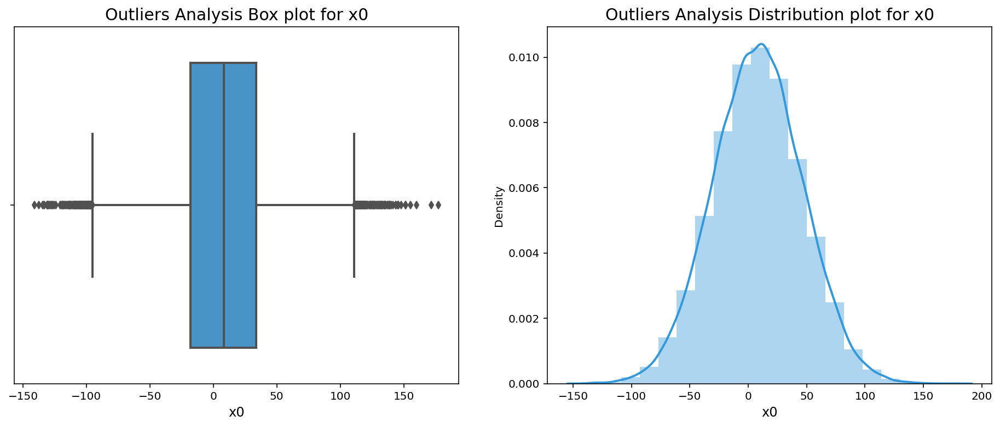

For feature x1. Upper bound : 37.38 Lower Bound: -43.96


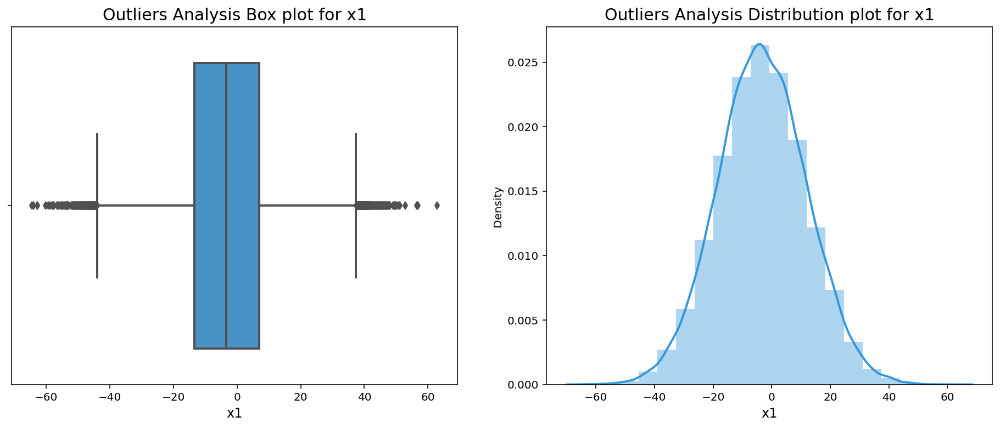

For feature x2. Upper bound : 67.53 Lower Bound: -65.42


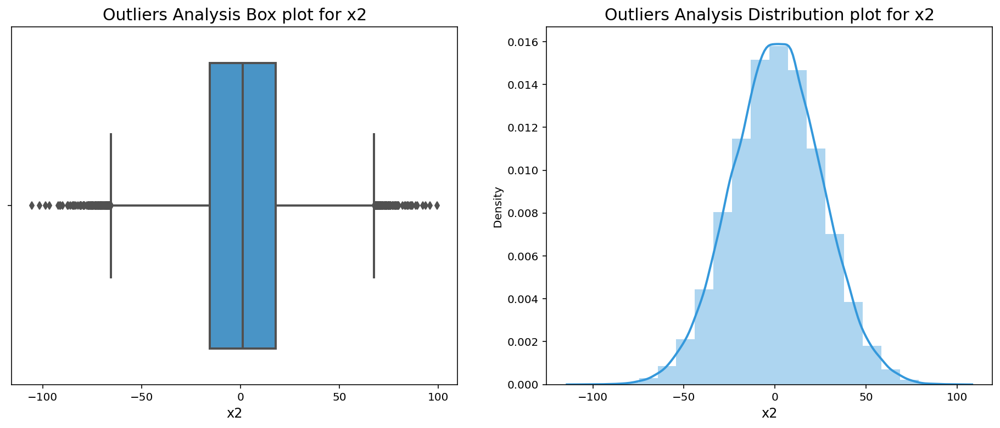

For feature x3. Upper bound : 40.48 Lower Bound: -42.01


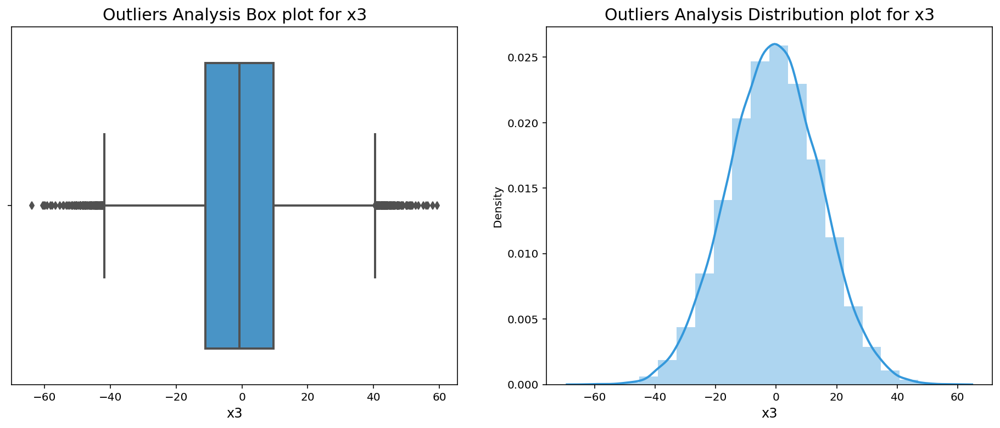

For feature x4. Upper bound : 114.16 Lower Bound: -113.68


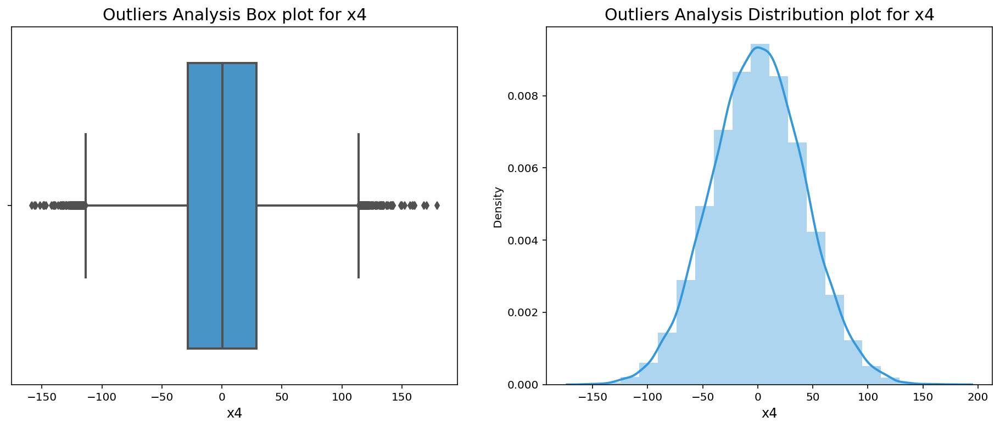

For feature x5. Upper bound : 112.64 Lower Bound: -116.20


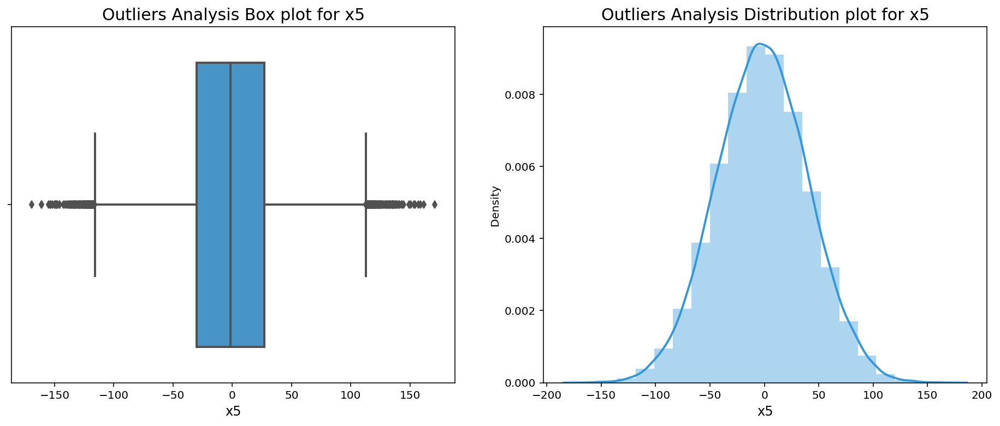

For feature x6. Upper bound : 2.87 Lower Bound: -2.88


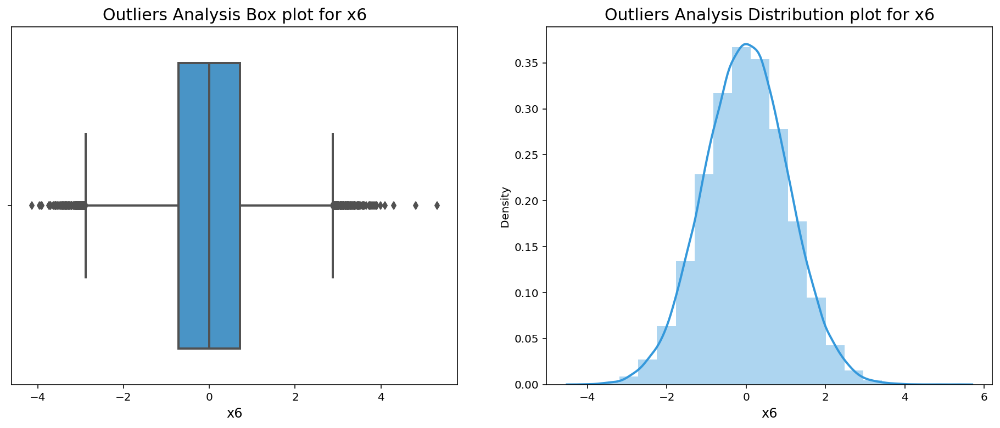

For feature x7. Upper bound : 9.10 Lower Bound: -9.14


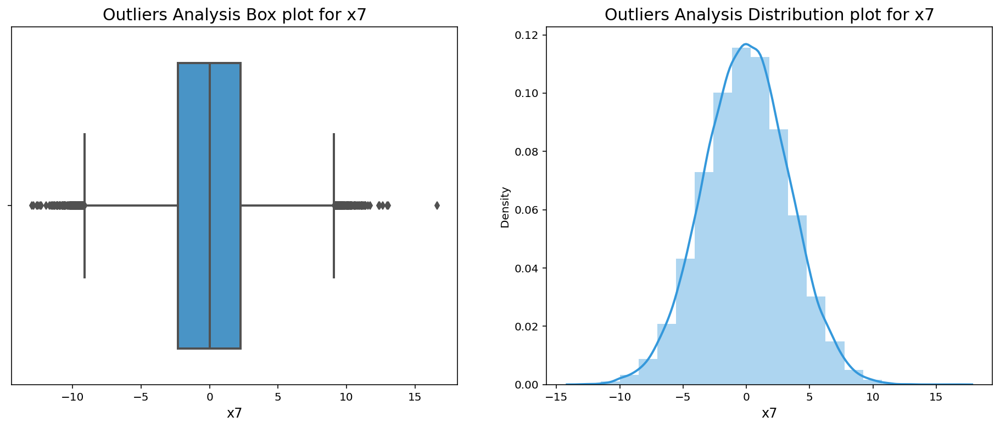

For feature x8. Upper bound : 7.25 Lower Bound: -8.55


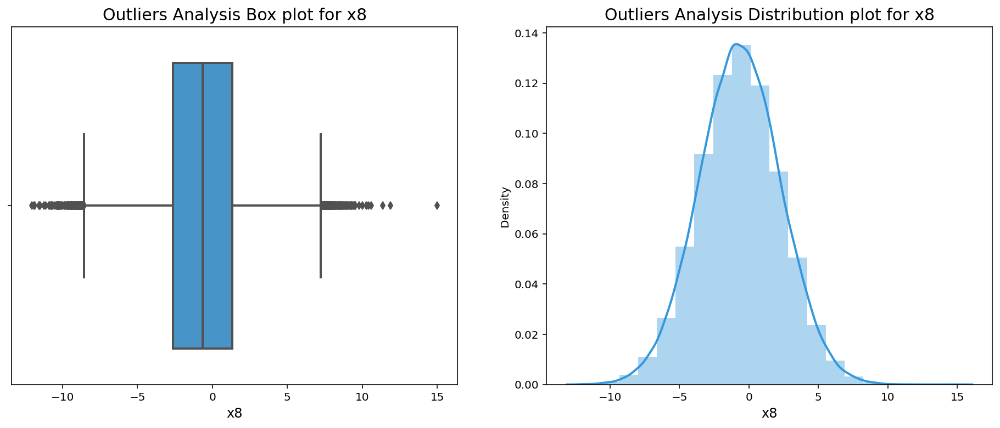

For feature x9. Upper bound : 5.11 Lower Bound: -5.14


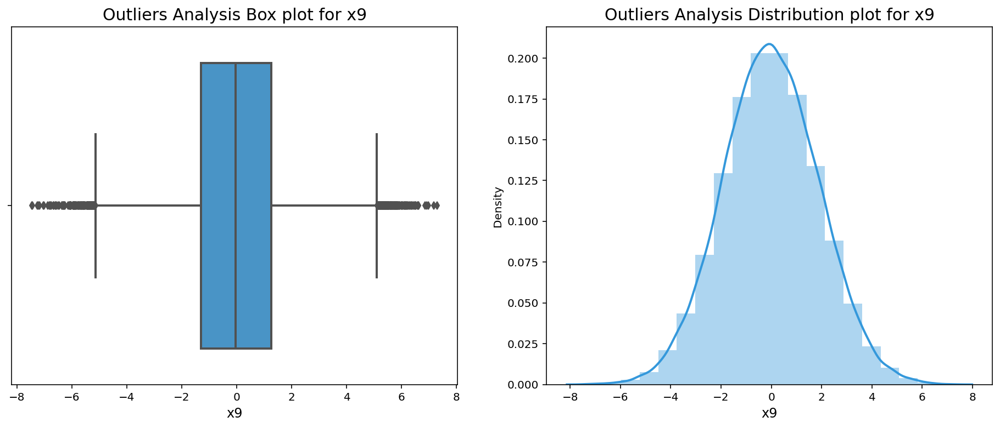

For feature x10. Upper bound : 4.31 Lower Bound: -3.74


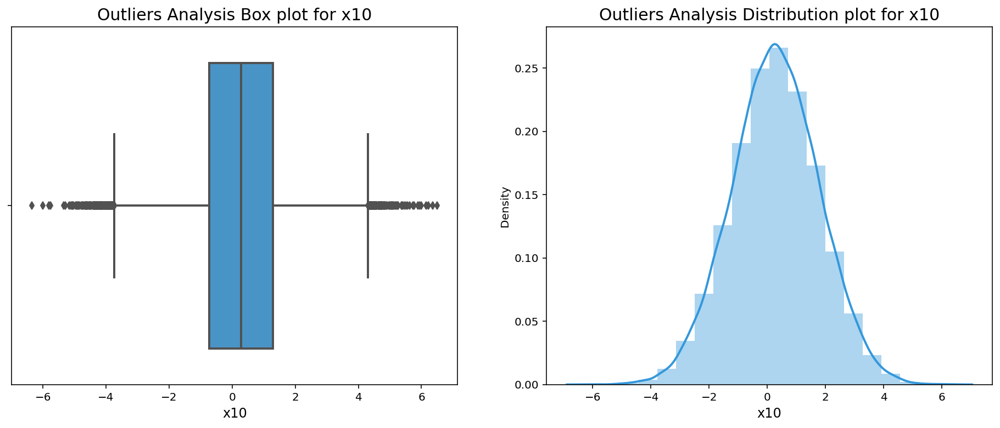

For feature x11. Upper bound : 17.33 Lower Bound: -17.31


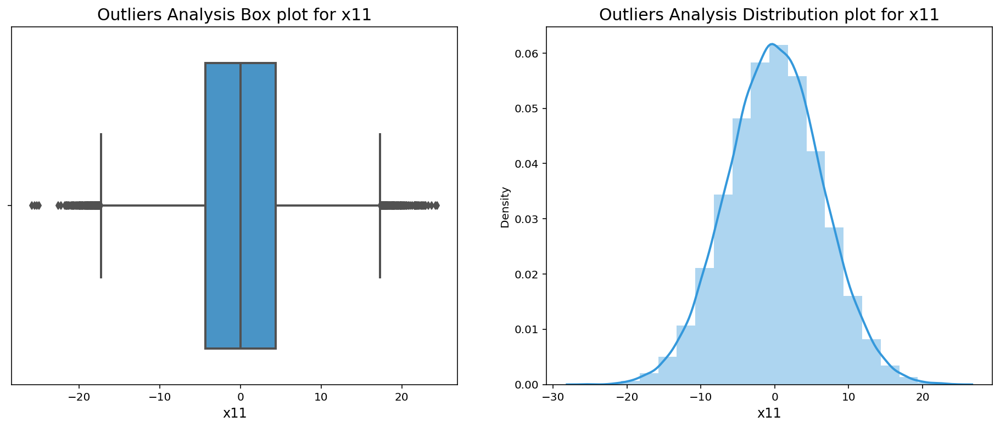

For feature x12. Upper bound : 72.89 Lower Bound: -87.94


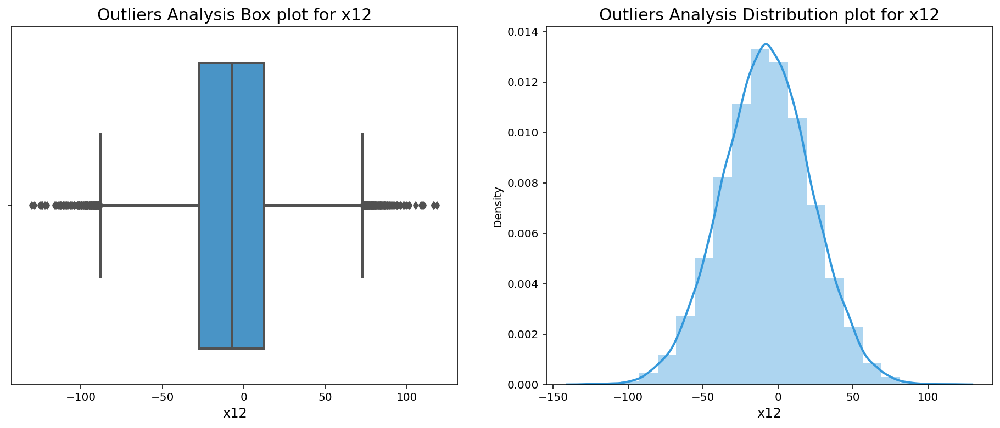

For feature x13. Upper bound : 8.09 Lower Bound: -8.08


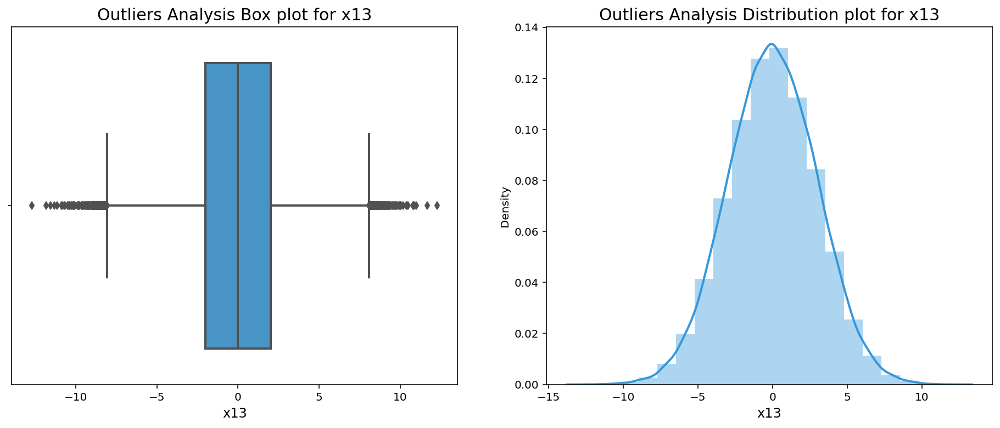

For feature x14. Upper bound : 4.56 Lower Bound: -4.55


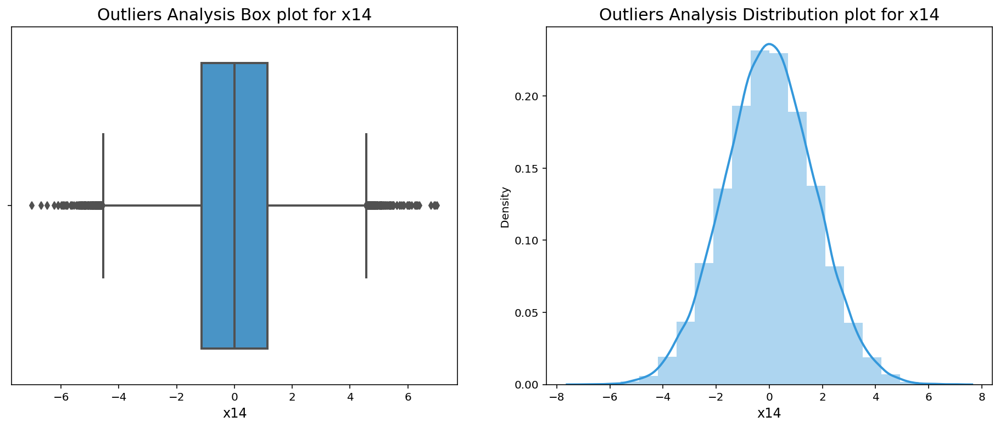

For feature x15. Upper bound : 24.10 Lower Bound: -24.03


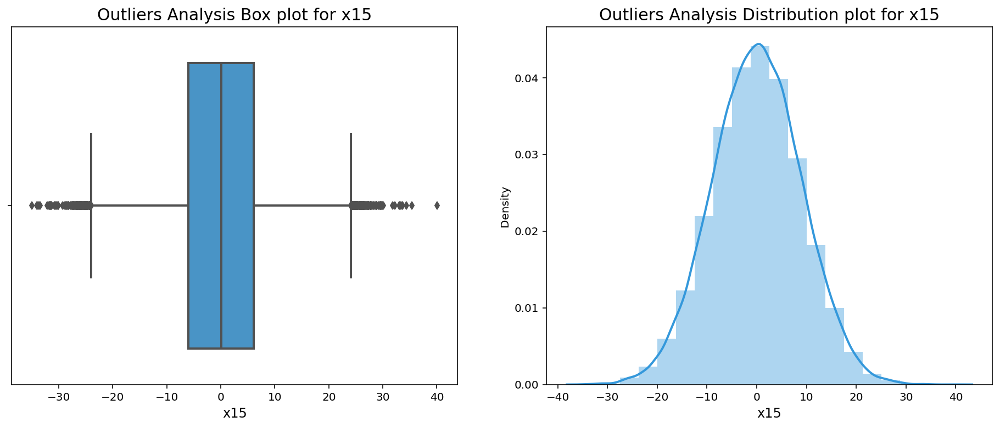

For feature x16. Upper bound : 26.64 Lower Bound: -26.66


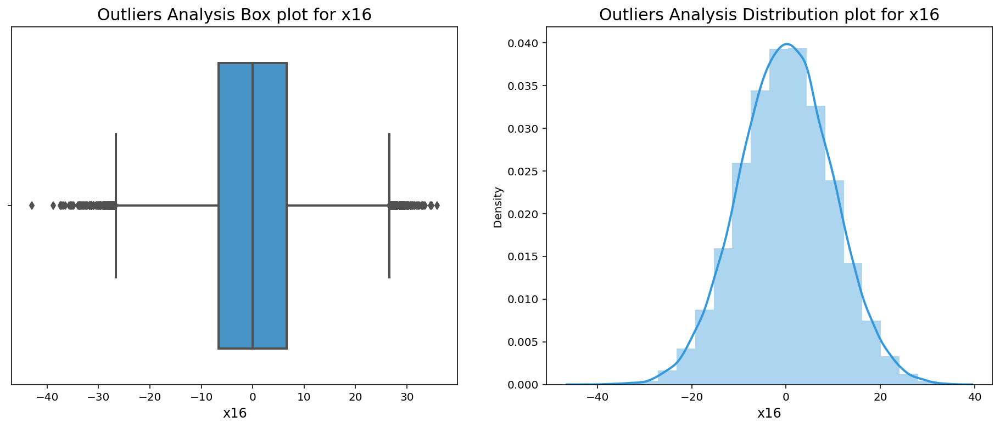

For feature x17. Upper bound : 6.18 Lower Bound: -6.18


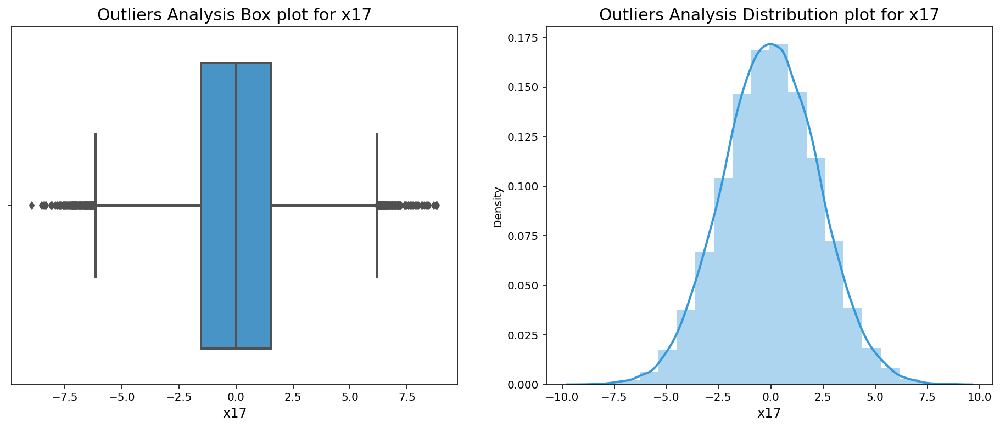

For feature x18. Upper bound : 19.51 Lower Bound: -16.19


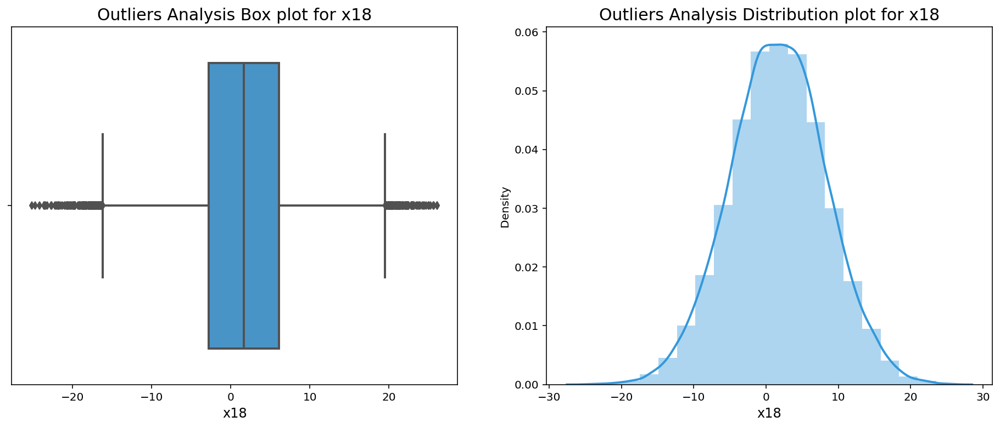

For feature x19. Upper bound : 96.33 Lower Bound: -96.42


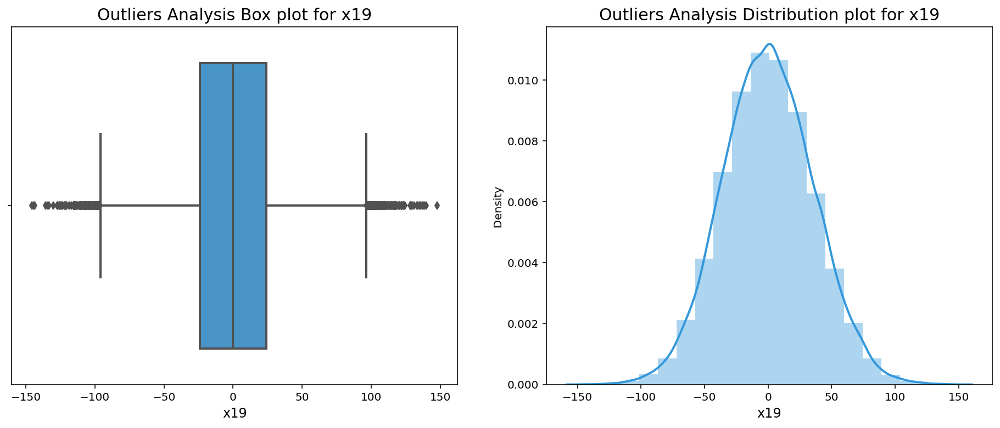

For feature x20. Upper bound : 110.47 Lower Bound: -95.91


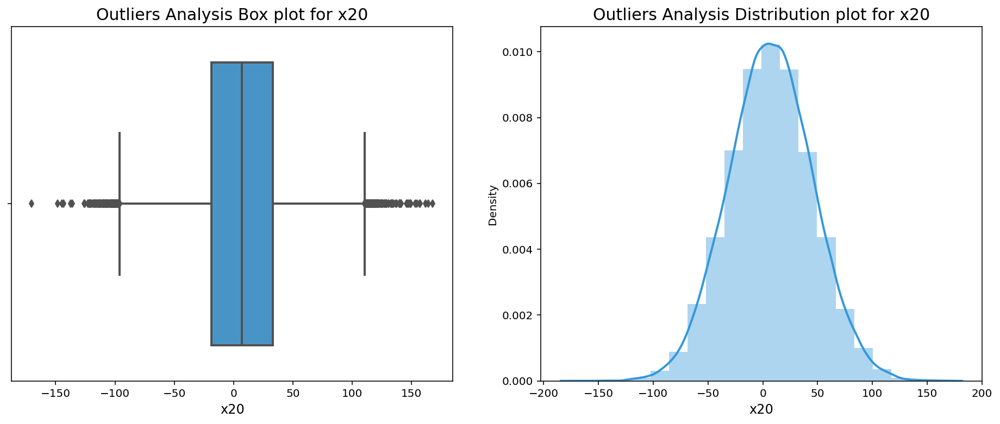

For feature x21. Upper bound : 4.94 Lower Bound: -4.31


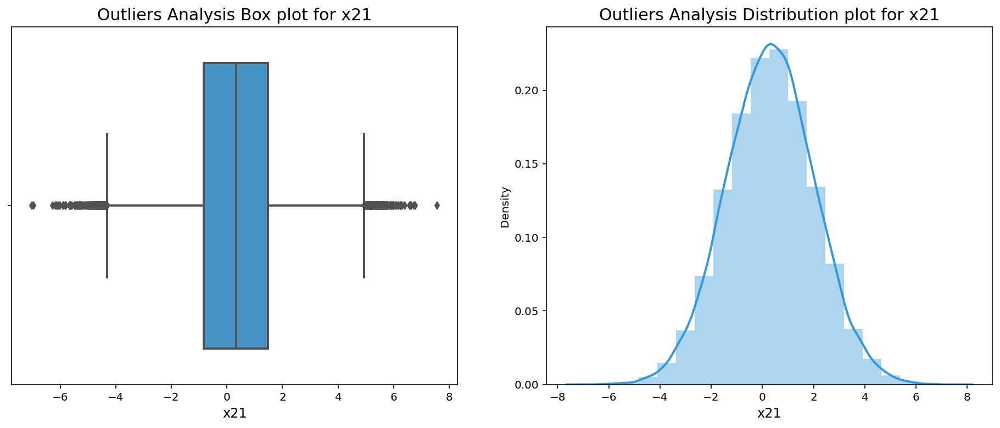

For feature x22. Upper bound : 50.68 Lower Bound: -53.05


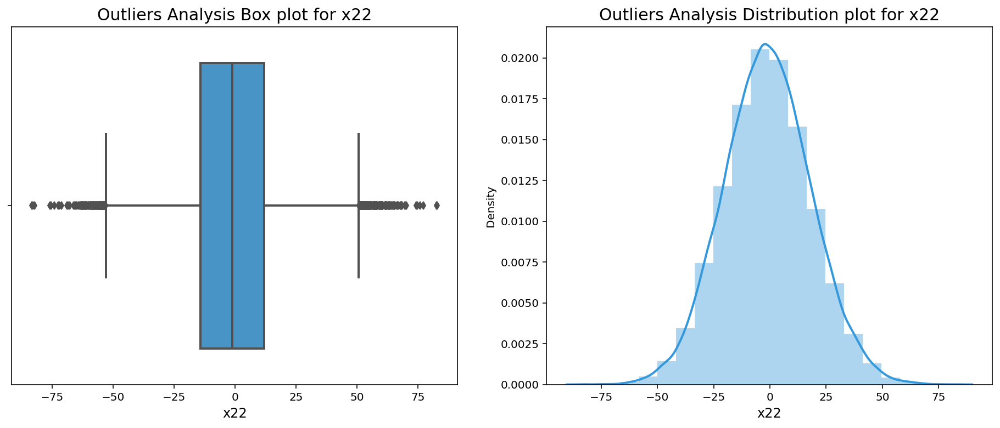

For feature x23. Upper bound : 21.98 Lower Bound: -22.08


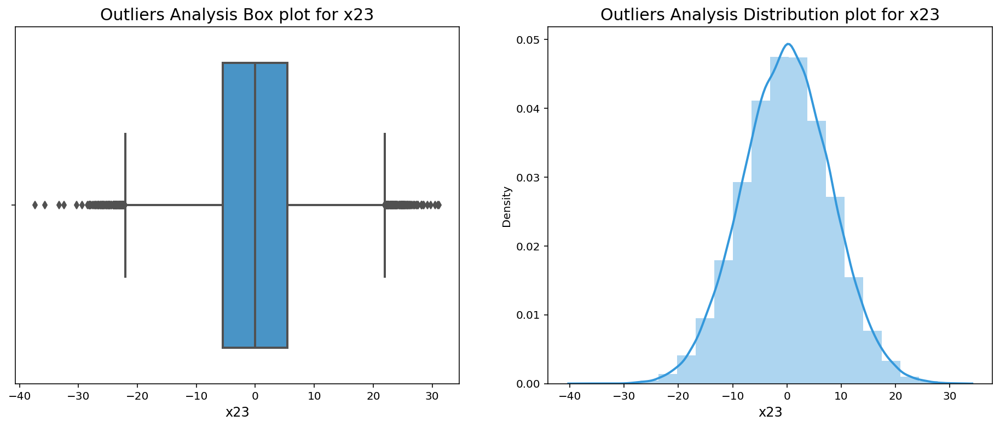

For feature x24. Upper bound : 26.98 Lower Bound: -26.88


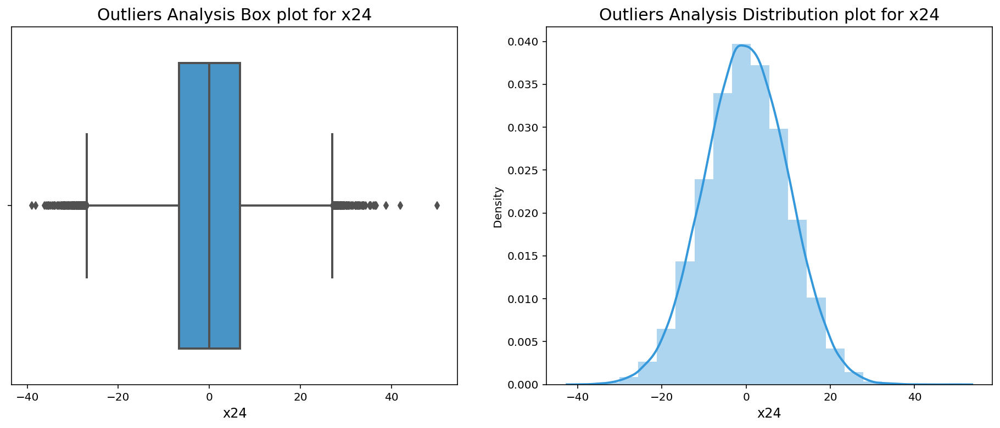

For feature x25. Upper bound : 69.80 Lower Bound: -69.73


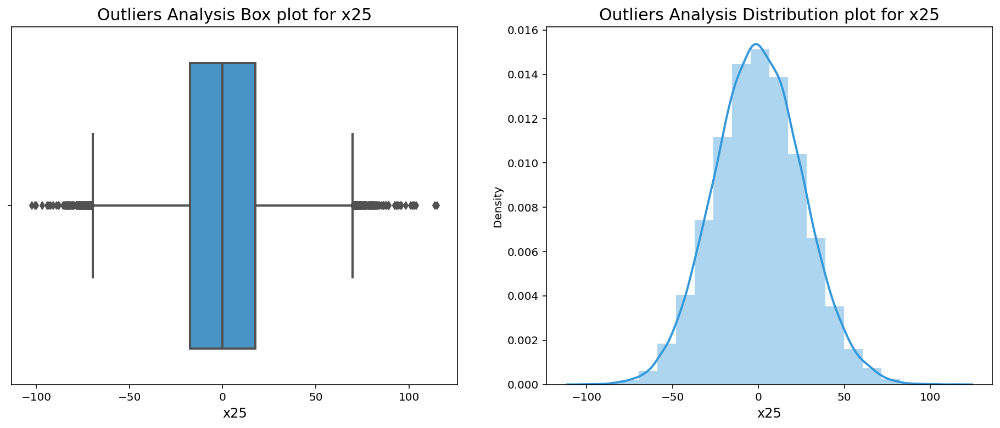

For feature x26. Upper bound : 10.65 Lower Bound: -10.65


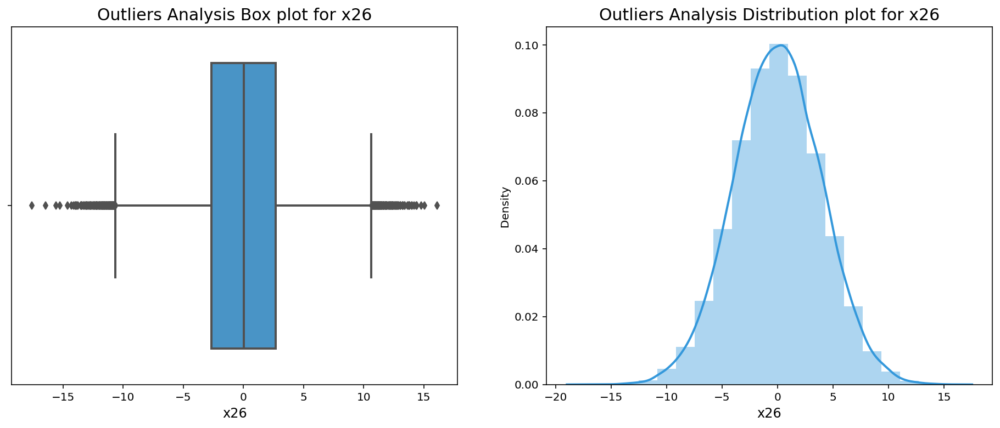

For feature x27. Upper bound : 52.03 Lower Bound: -43.72


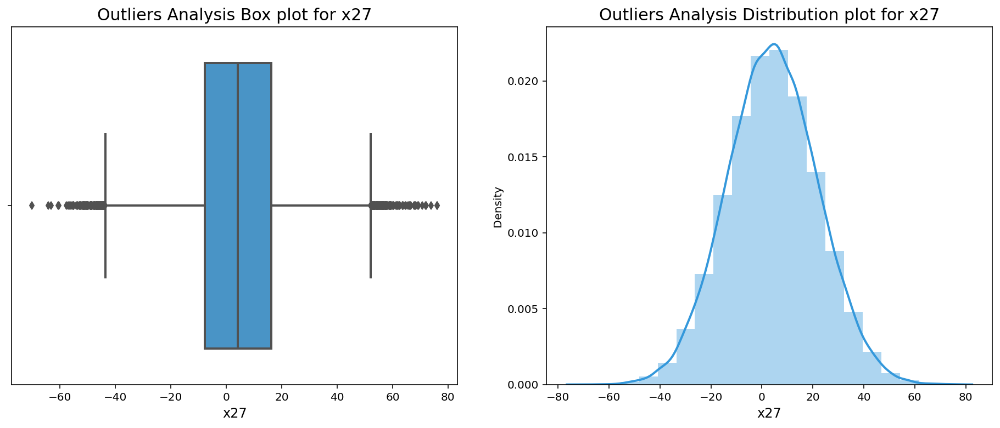

For feature x28. Upper bound : 6.05 Lower Bound: -6.11


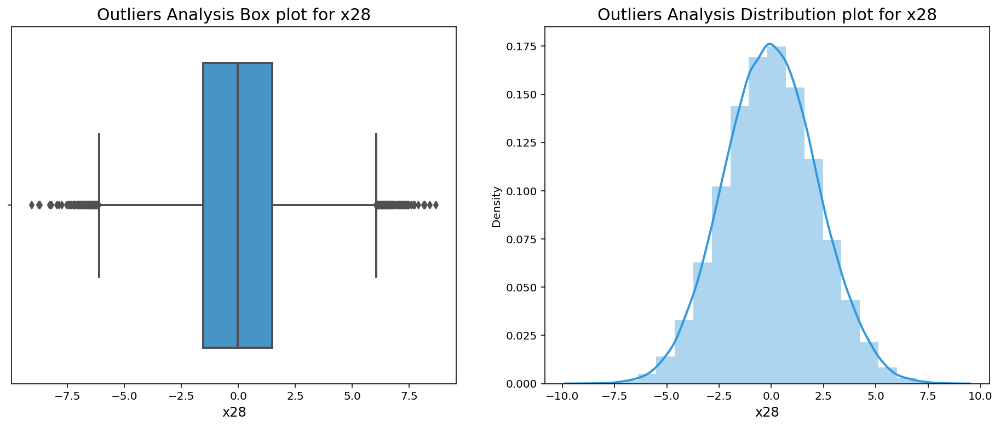

For feature x29. Upper bound : 4.14 Lower Bound: -4.13


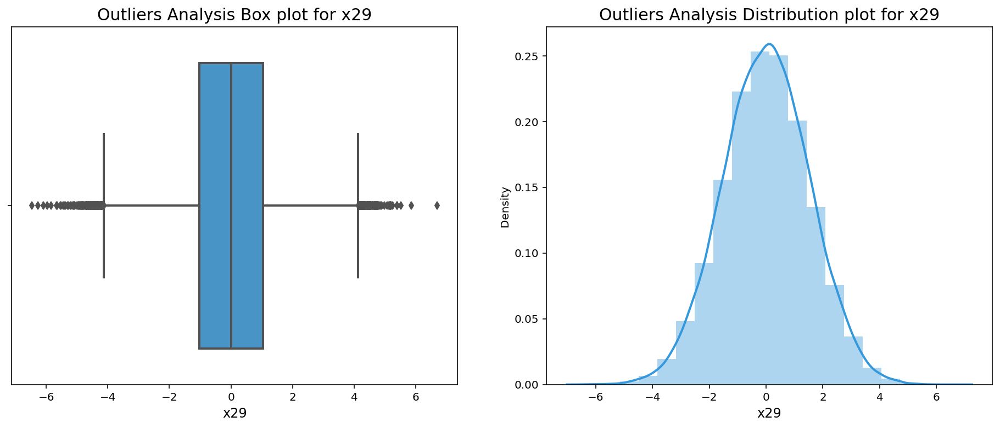

For feature x30. Upper bound : 9.85 Lower Bound: -9.89


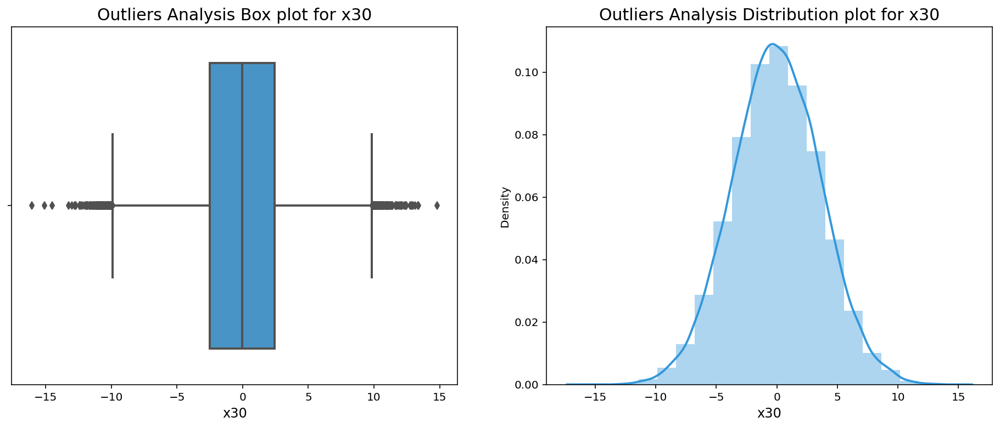

For feature x31. Upper bound : 2.96 Lower Bound: -2.95


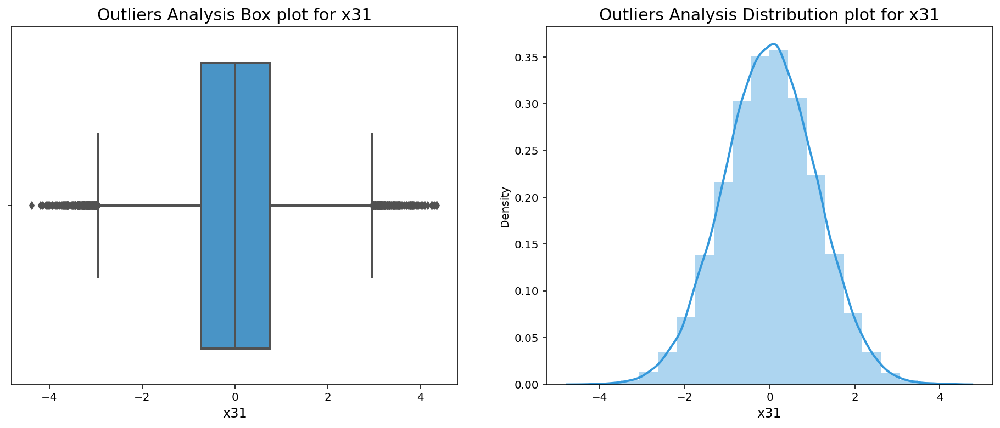

For feature x32. Upper bound : 2.61 Lower Bound: -2.61


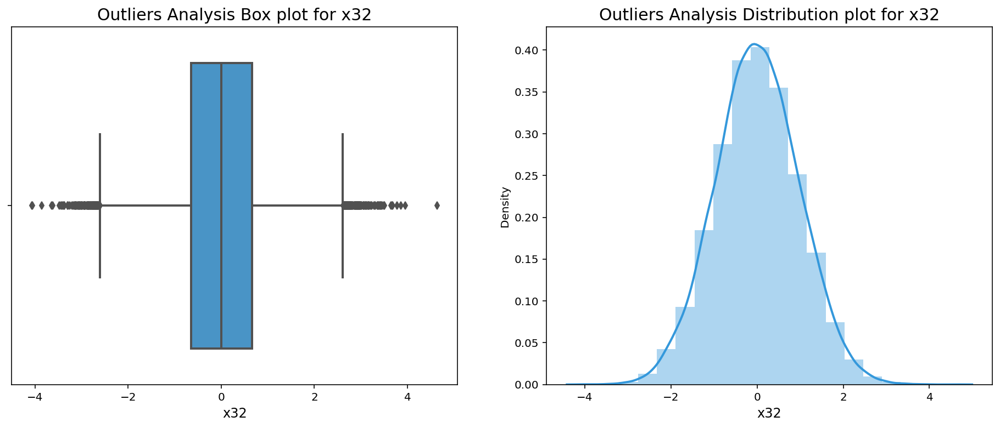

For feature x33. Upper bound : 89.56 Lower Bound: -103.75


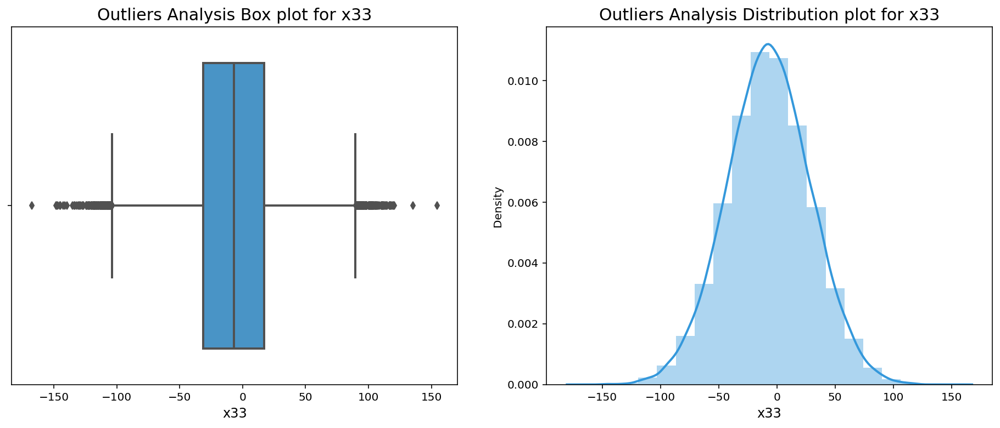

For feature x36. Upper bound : 24.85 Lower Bound: -24.81


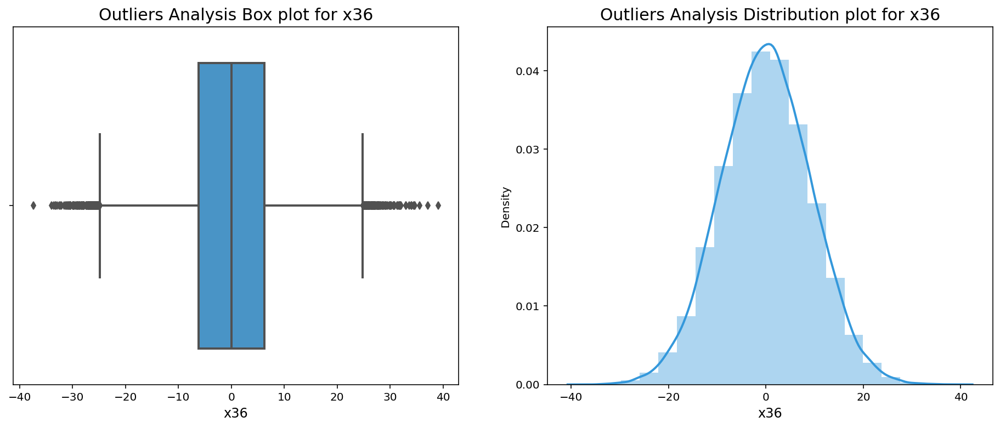

For feature x37. Upper bound : 26.18 Lower Bound: -23.52


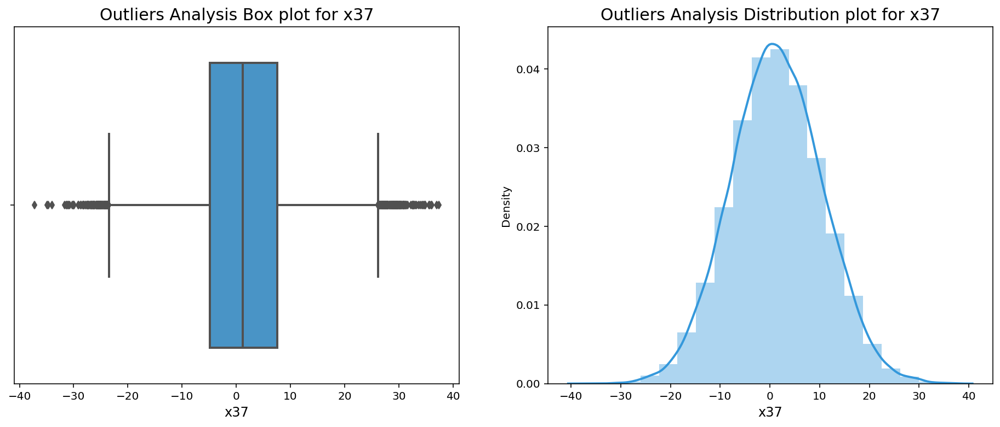

For feature x38. Upper bound : 3.60 Lower Bound: -3.60


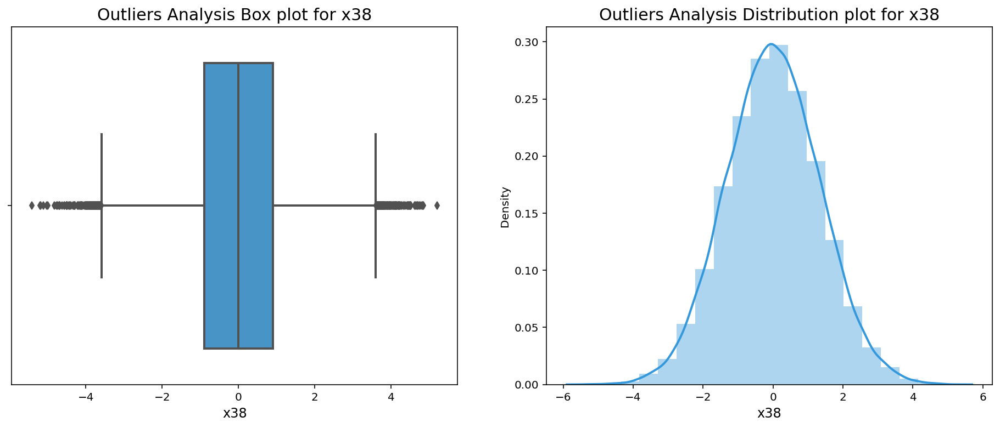

For feature x39. Upper bound : 4.33 Lower Bound: -4.31


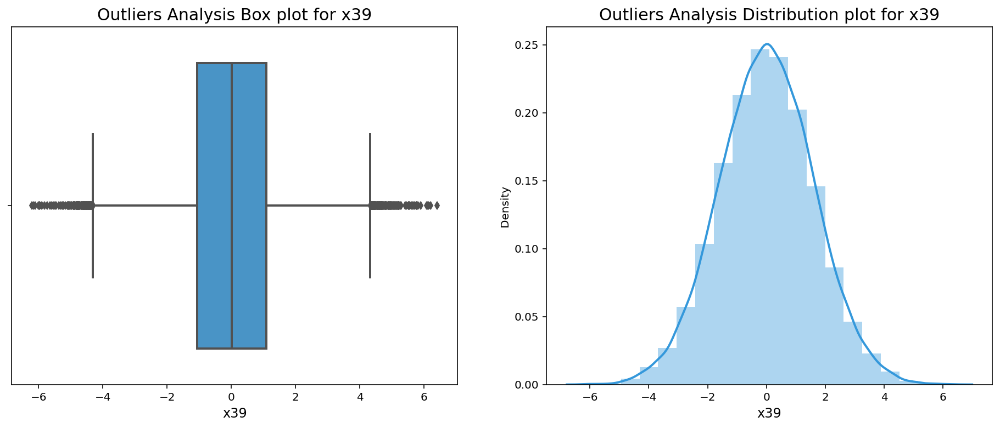

For feature x40. Upper bound : 17.34 Lower Bound: -16.79


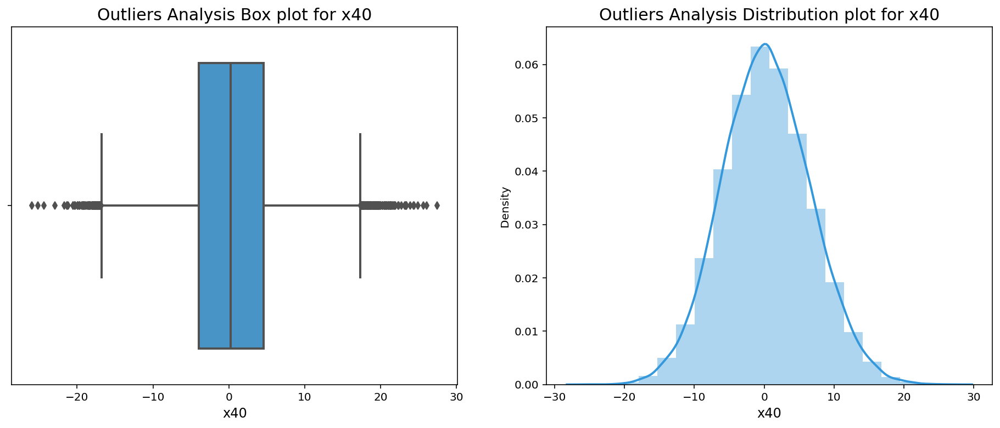

For feature x41. Upper bound : 2701.55 Lower Bound: -2694.13


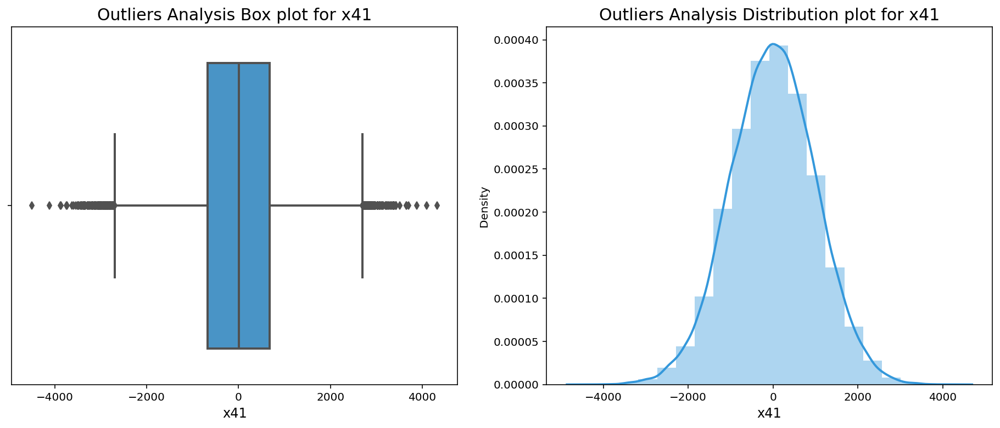

For feature x42. Upper bound : 431.91 Lower Bound: -438.88


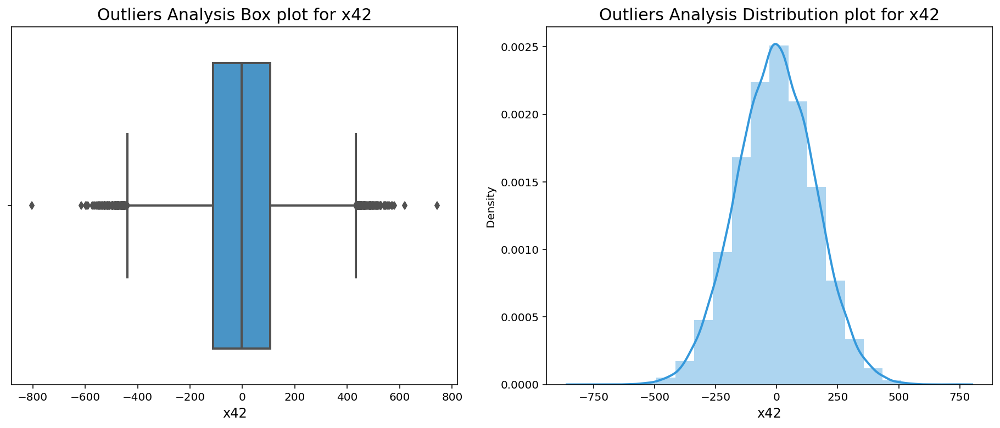

For feature x43. Upper bound : 60.98 Lower Bound: -61.17


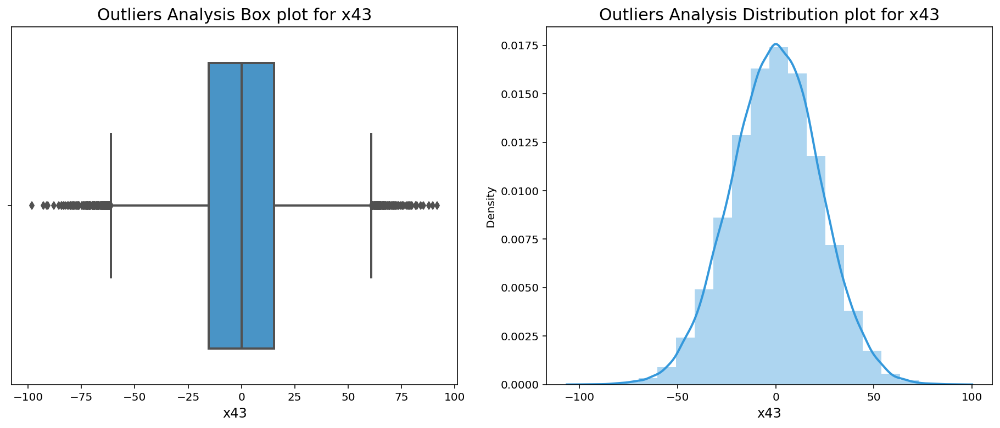

For feature x44. Upper bound : 235.76 Lower Bound: -281.69


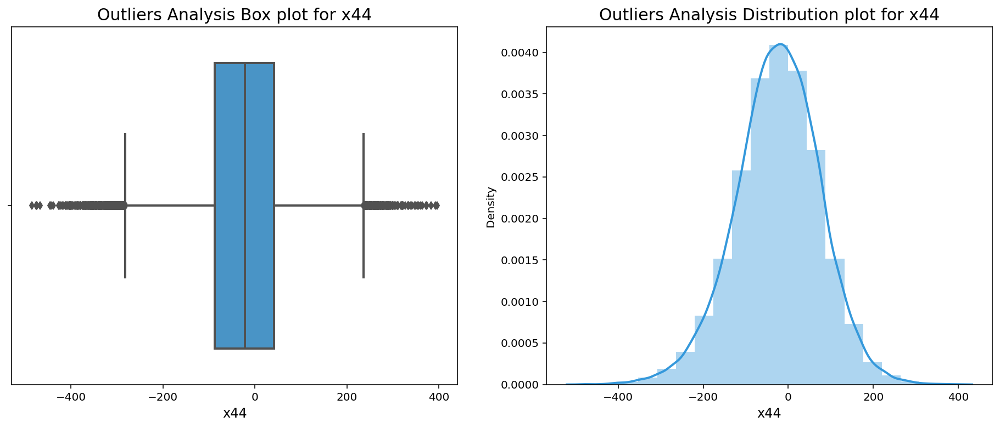

For feature x45. Upper bound : 0.04 Lower Bound: -0.04


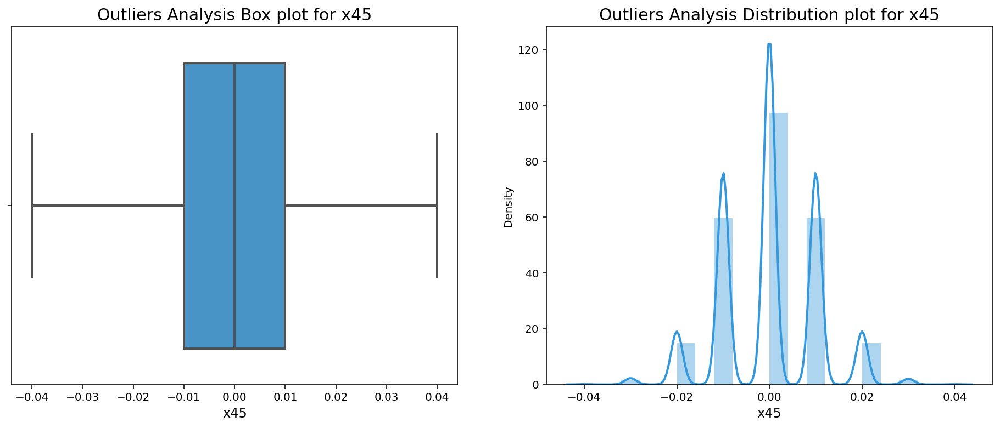

For feature x46. Upper bound : 9.75 Lower Bound: -9.79


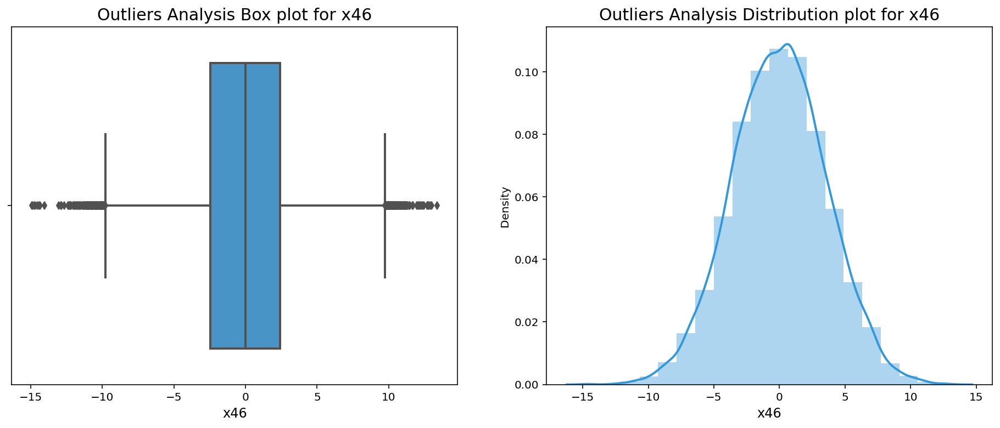

For feature x47. Upper bound : 61.55 Lower Bound: -61.63


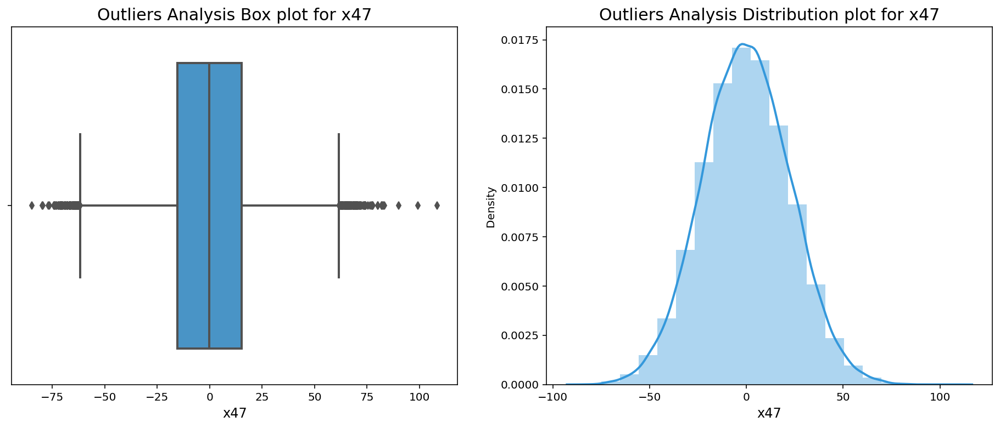

For feature x48. Upper bound : 4.35 Lower Bound: -4.33


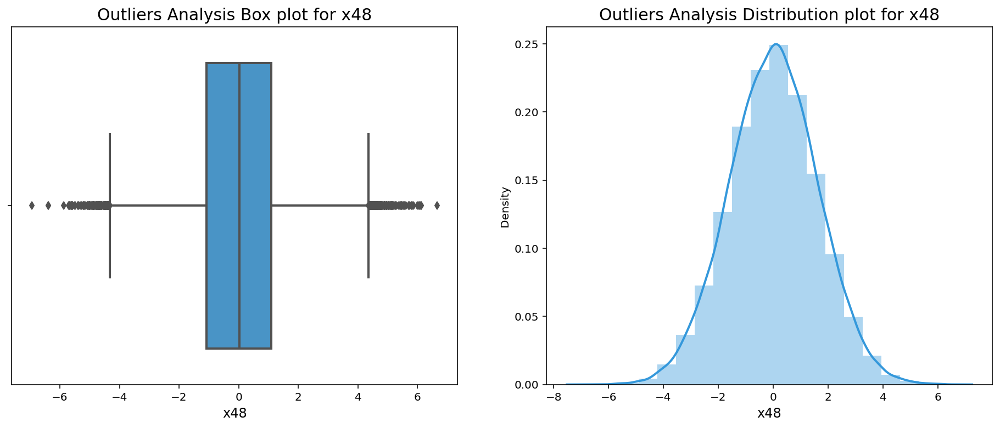

For feature x49. Upper bound : 103.38 Lower Bound: -102.85


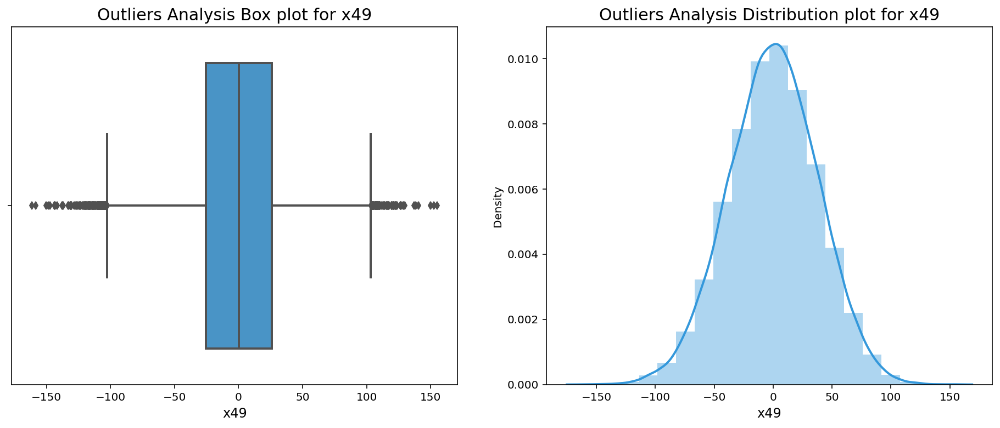

For feature x50. Upper bound : 1.34 Lower Bound: -1.16


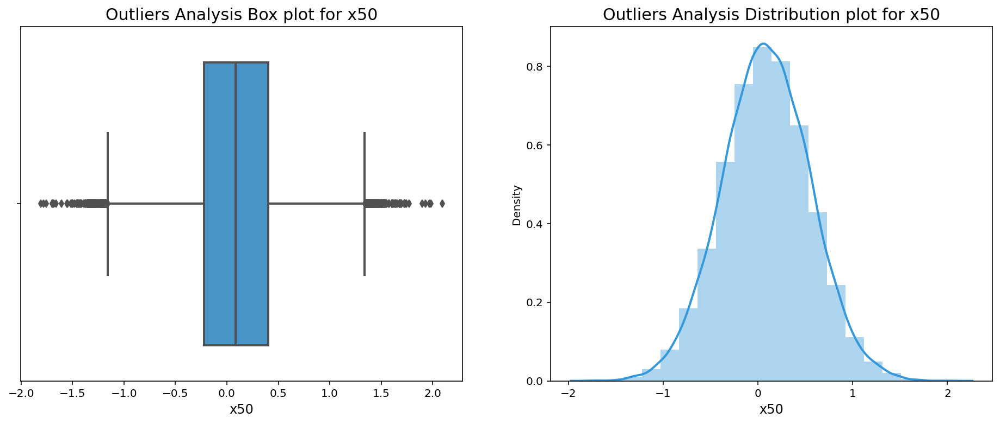

For feature x51. Upper bound : 28.58 Lower Bound: -32.60


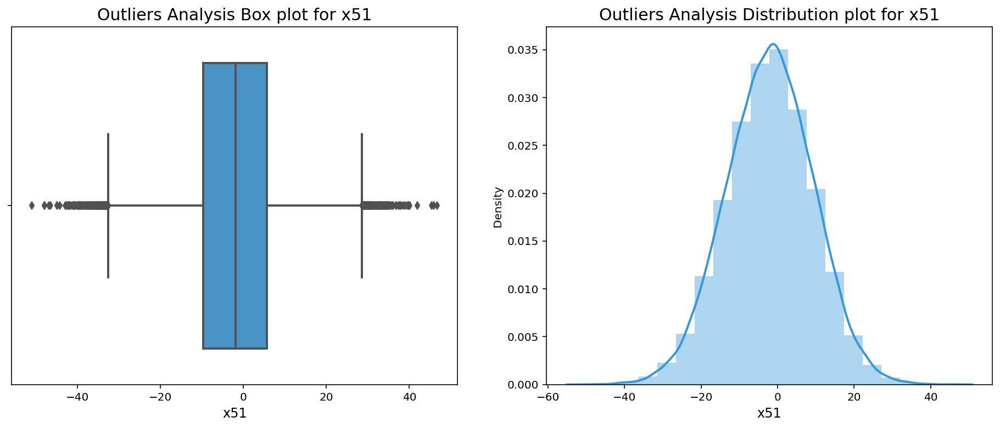

For feature x52. Upper bound : 11.18 Lower Bound: -11.17


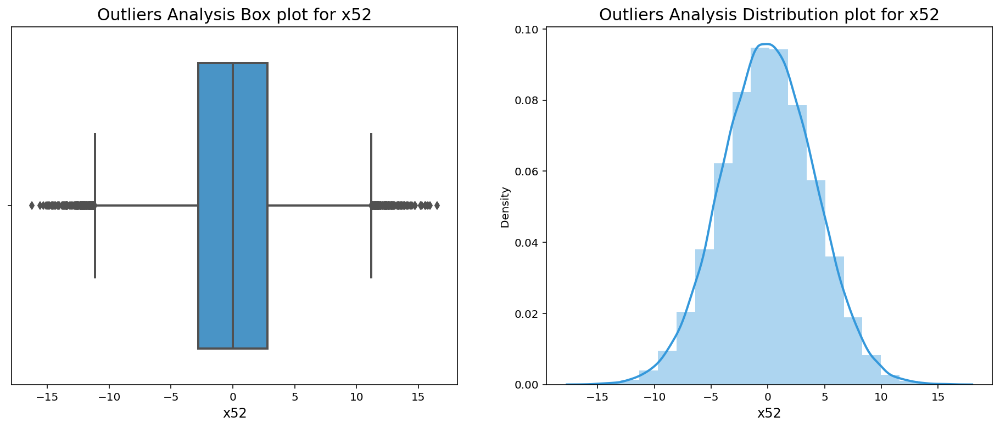

For feature x53. Upper bound : 63.31 Lower Bound: -62.96


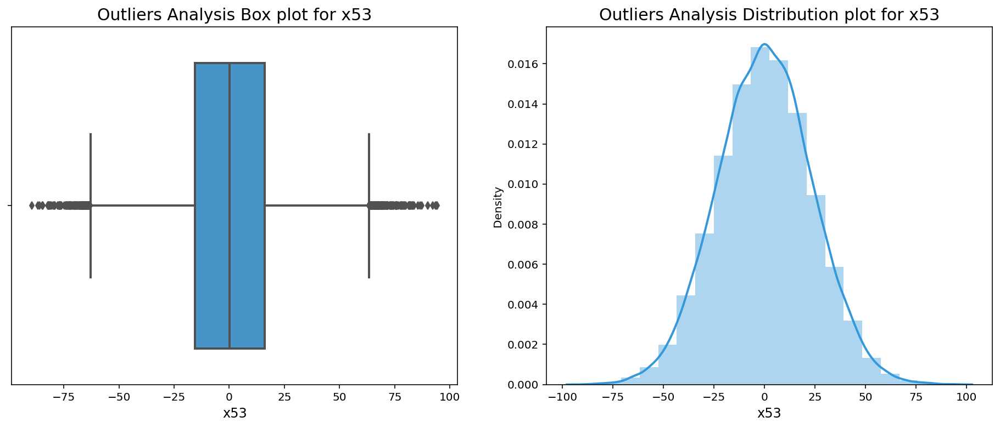

For feature x54. Upper bound : 25.98 Lower Bound: -26.16


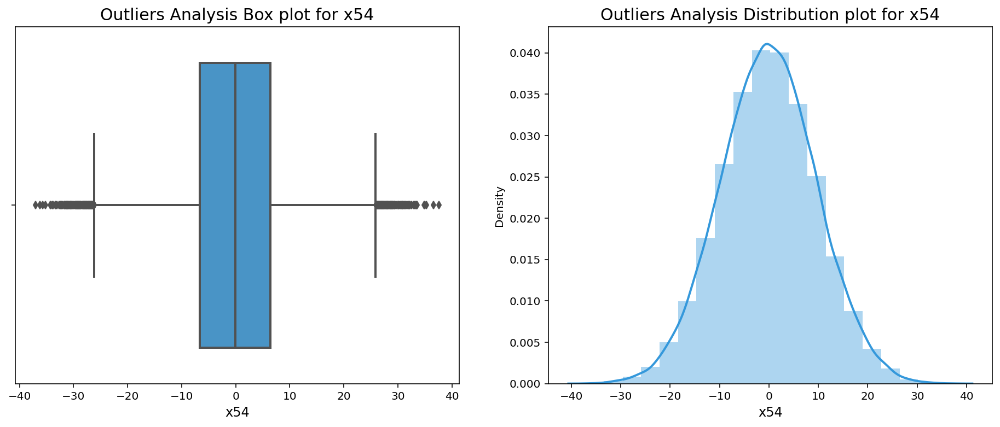

For feature x55. Upper bound : 2.53 Lower Bound: -2.51


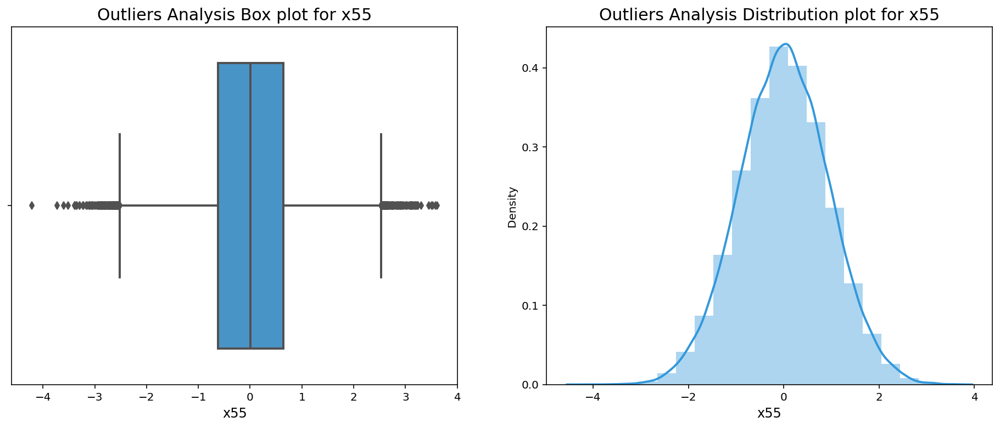

For feature x56. Upper bound : 18.80 Lower Bound: -19.45


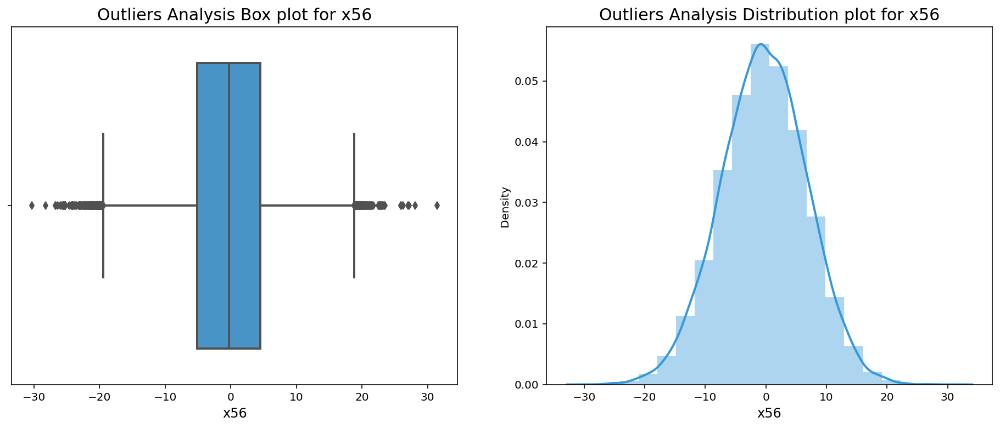

For feature x57. Upper bound : 84.69 Lower Bound: -85.63


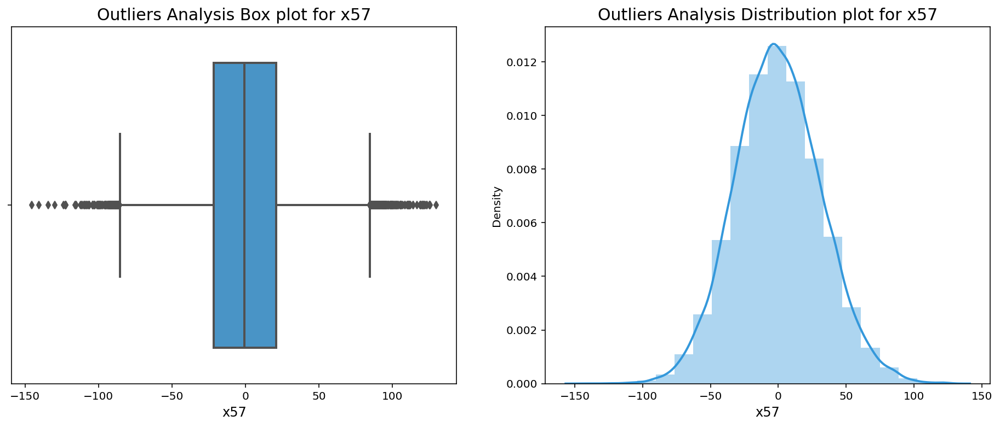

For feature x58. Upper bound : 55.08 Lower Bound: -61.36


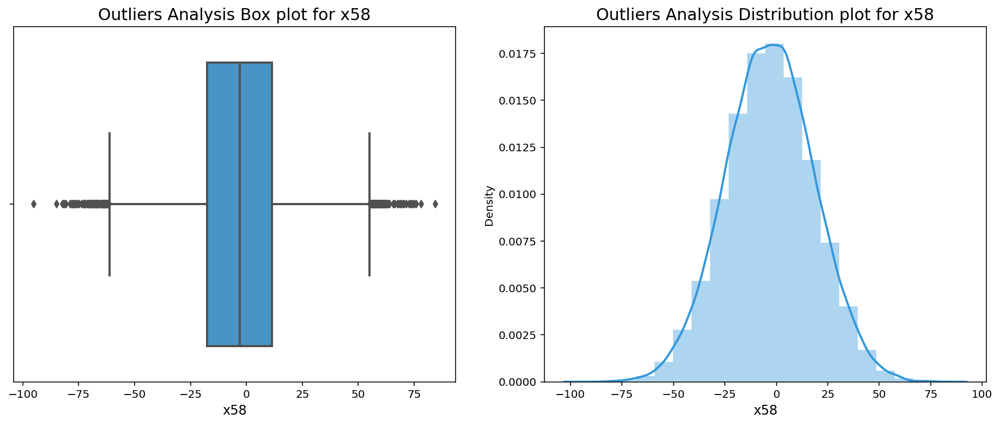

For feature x59. Upper bound : 23.52 Lower Bound: -23.52


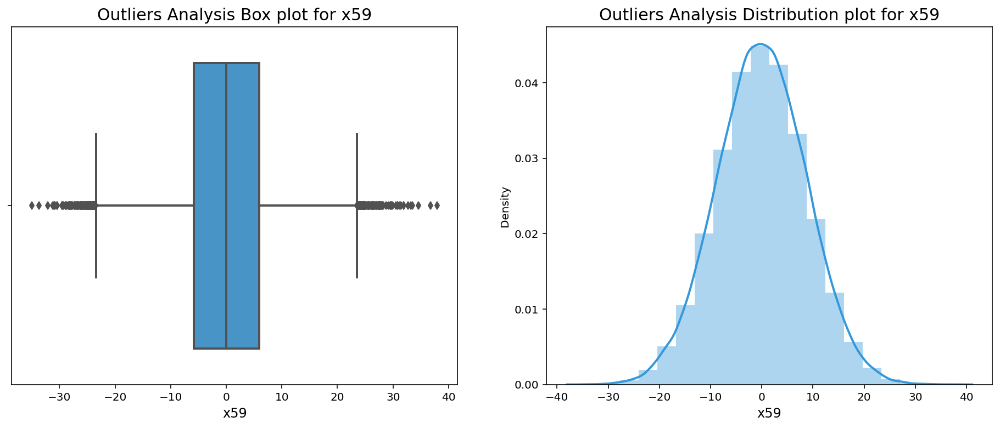

For feature x60. Upper bound : 2.04 Lower Bound: -2.04


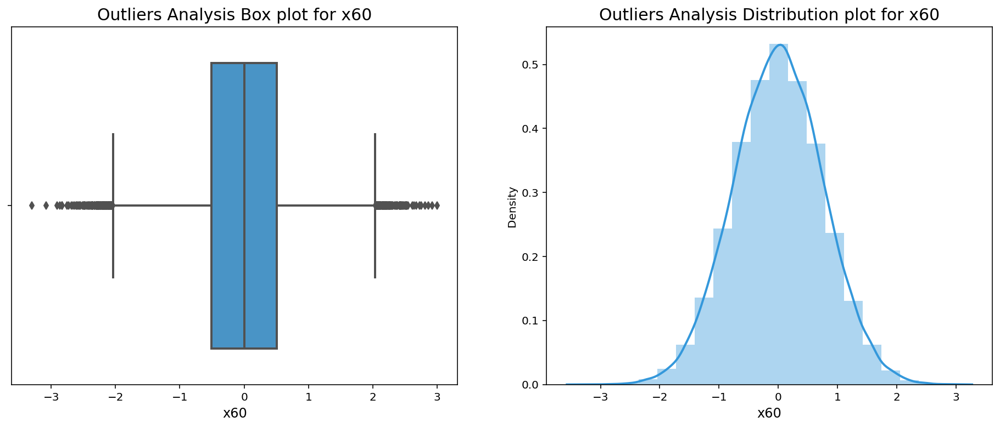

For feature x61. Upper bound : 50.90 Lower Bound: -50.73


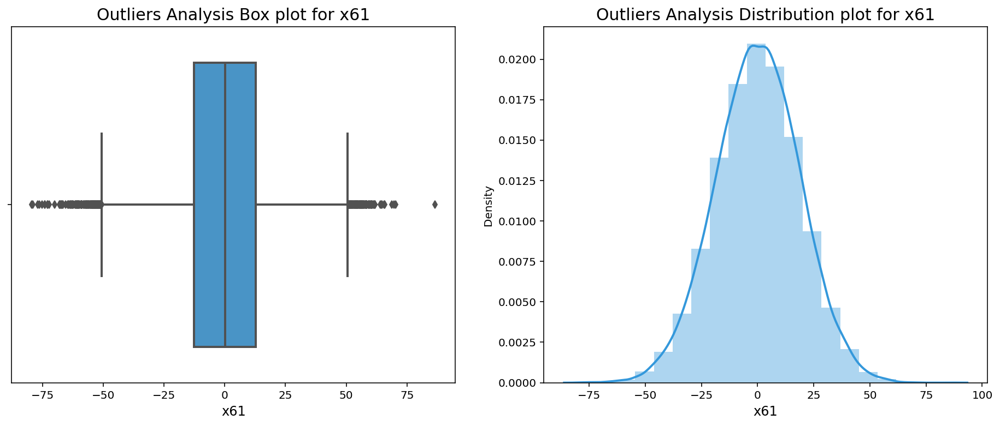

For feature x62. Upper bound : 9.14 Lower Bound: -9.14


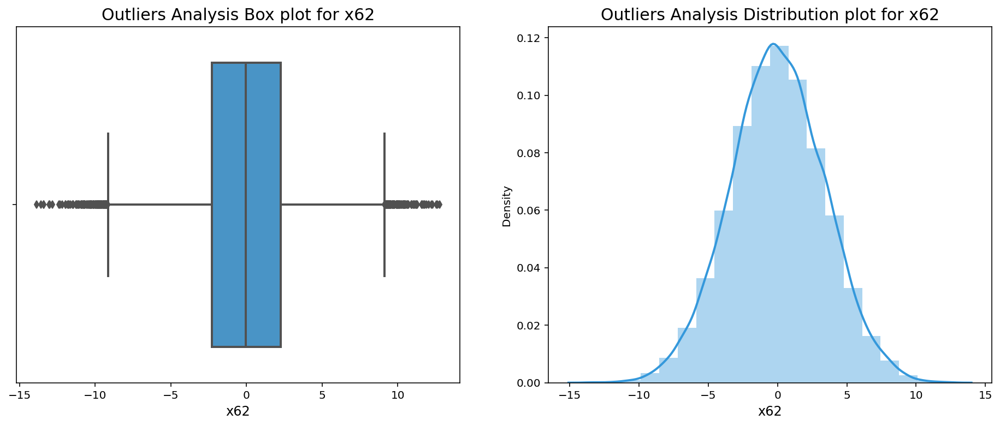

For feature x63. Upper bound : 9.90 Lower Bound: -11.37


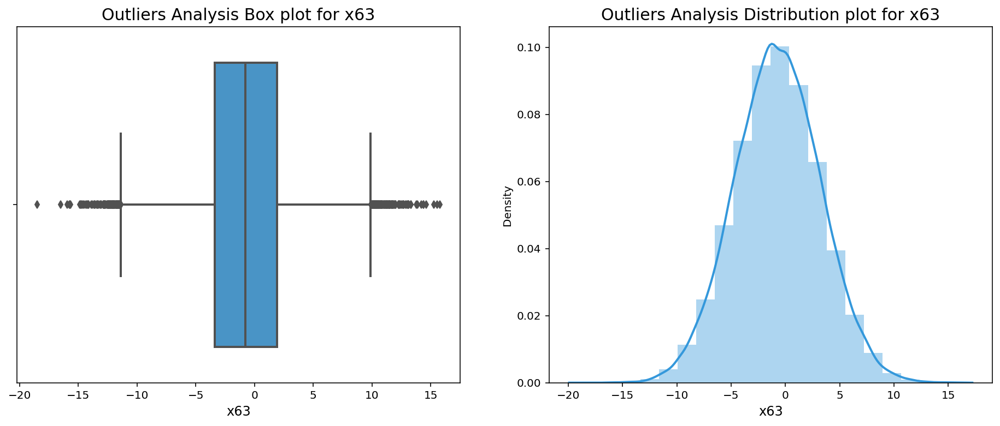

For feature x64. Upper bound : 3.77 Lower Bound: -3.76


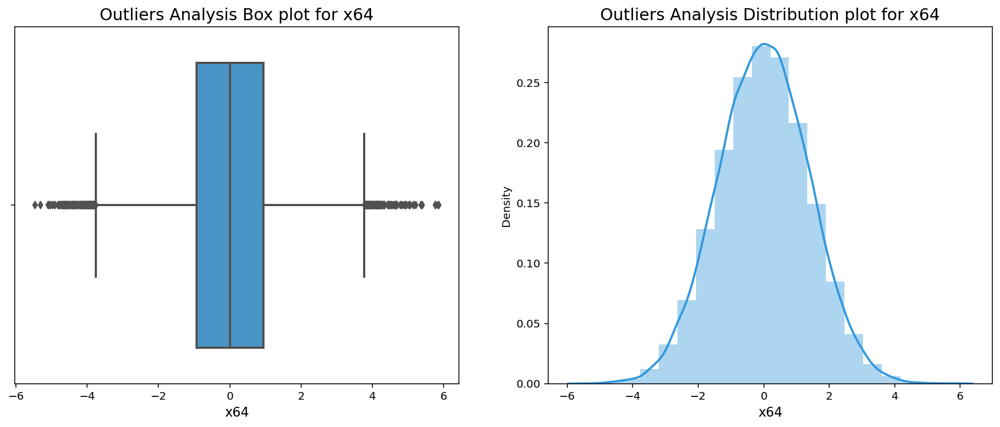

For feature x65. Upper bound : 20.42 Lower Bound: -20.50


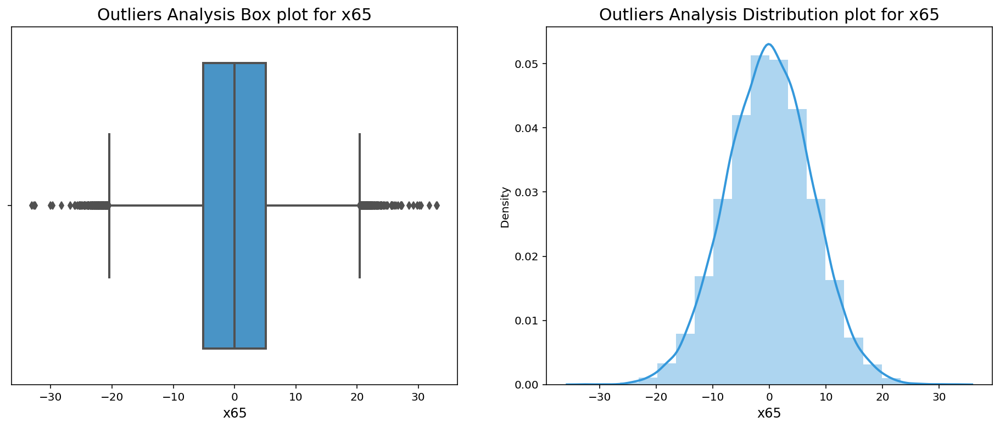

For feature x66. Upper bound : 84.36 Lower Bound: -88.06


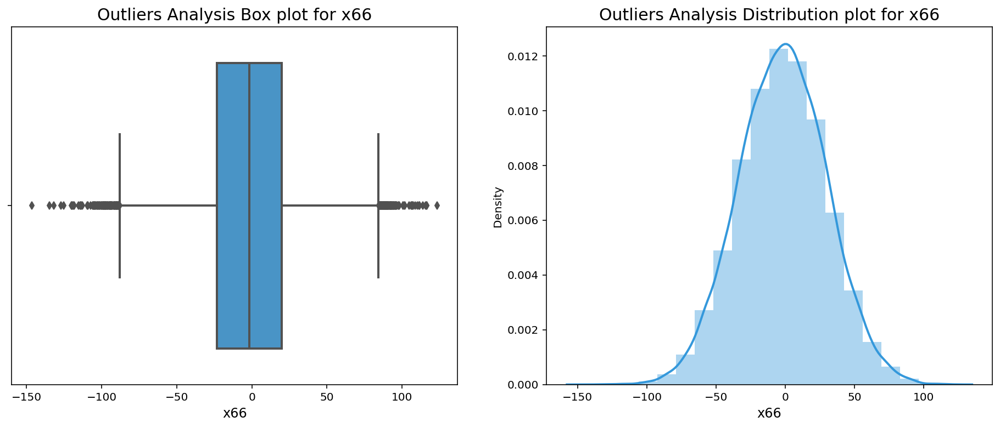

For feature x67. Upper bound : 26.05 Lower Bound: -26.12


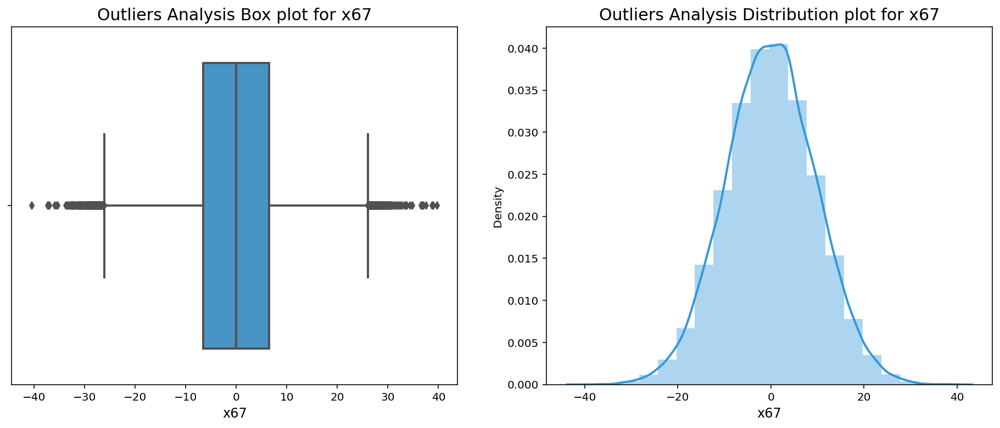

For feature x69. Upper bound : 72.84 Lower Bound: -79.19


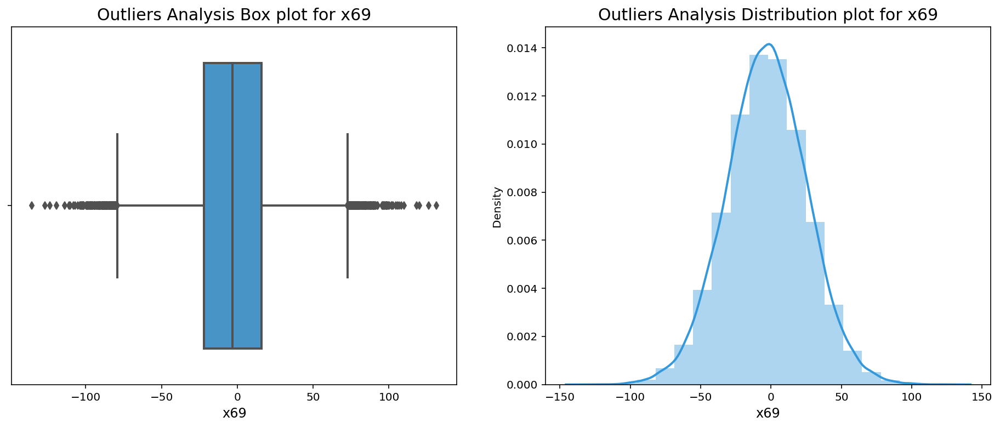

For feature x70. Upper bound : 57.91 Lower Bound: -50.13


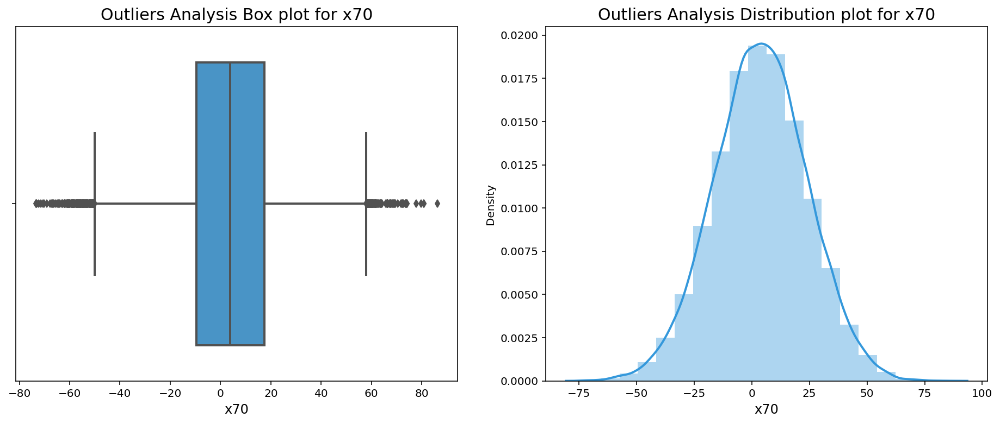

For feature x71. Upper bound : 2.93 Lower Bound: -2.91


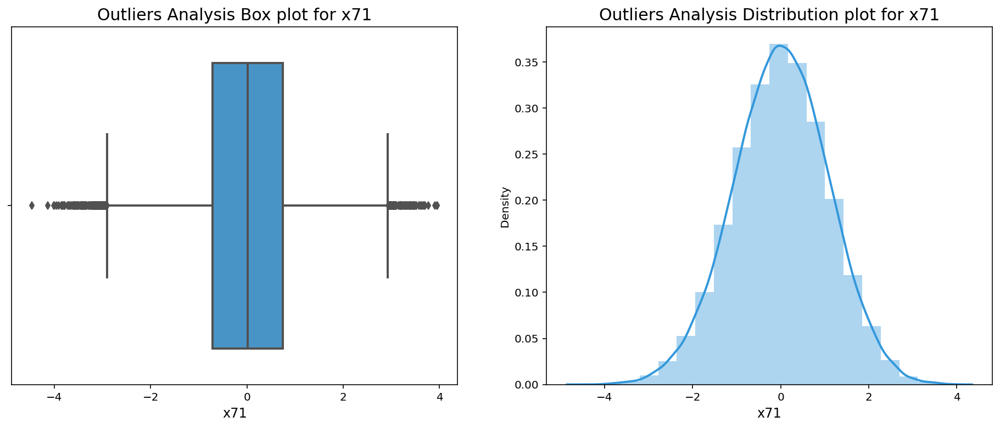

For feature x72. Upper bound : 50.35 Lower Bound: -58.36


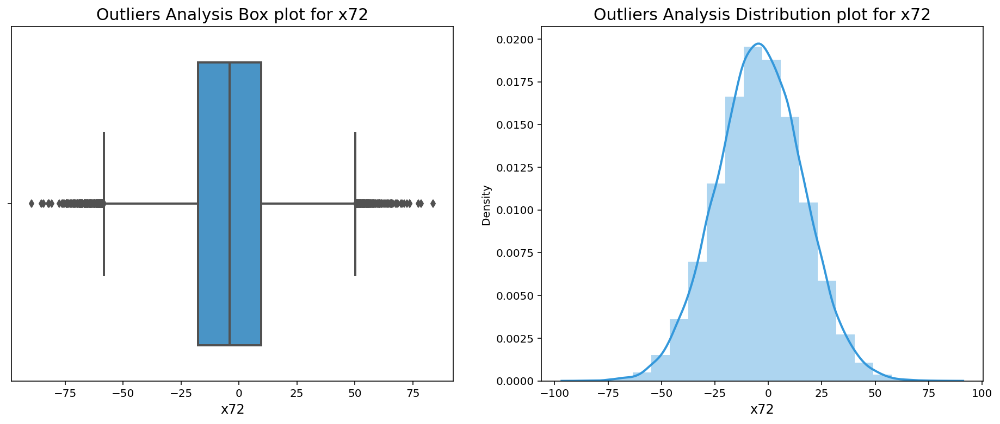

For feature x73. Upper bound : 52.43 Lower Bound: -60.25


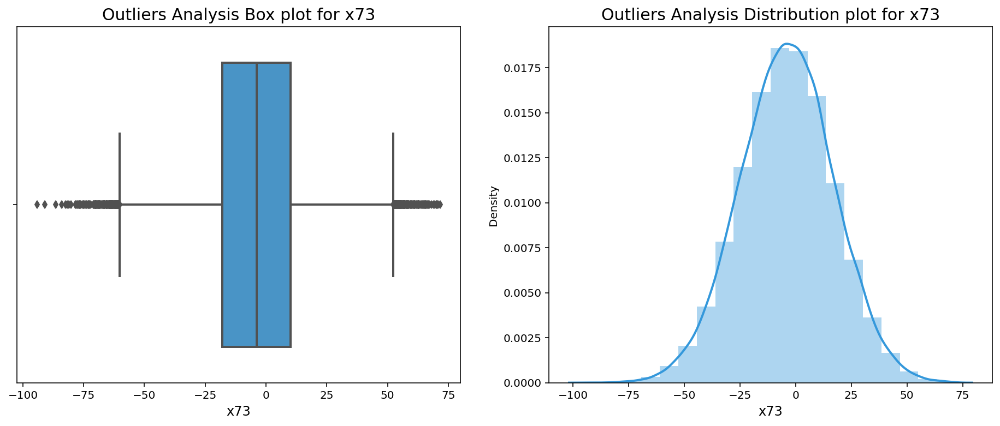

For feature x74. Upper bound : 105.84 Lower Bound: -105.70


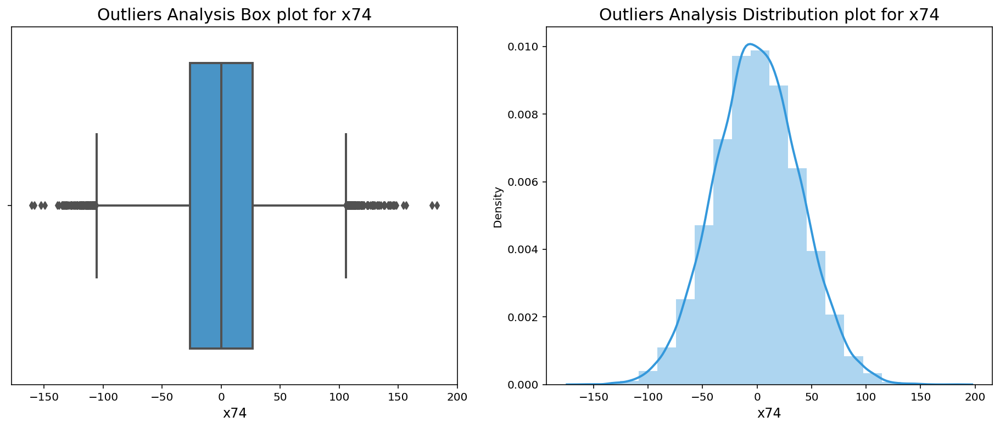

For feature x75. Upper bound : 106.91 Lower Bound: -95.20


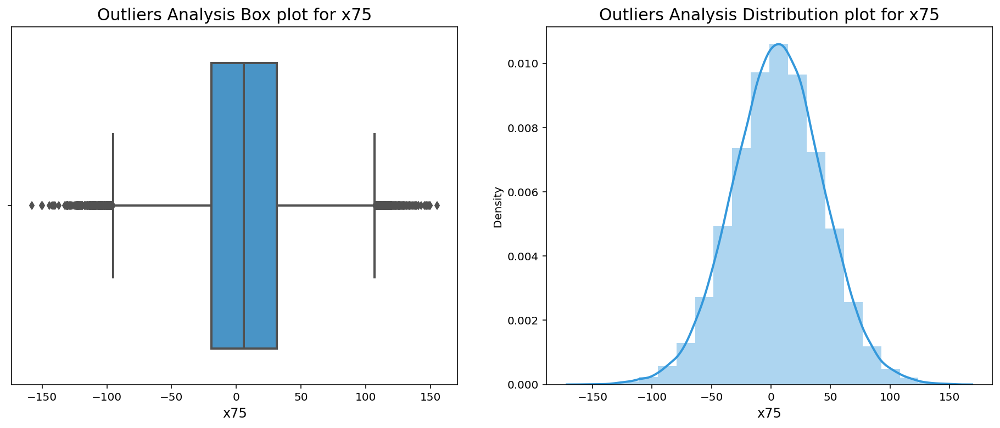

For feature x76. Upper bound : 2.40 Lower Bound: -2.40


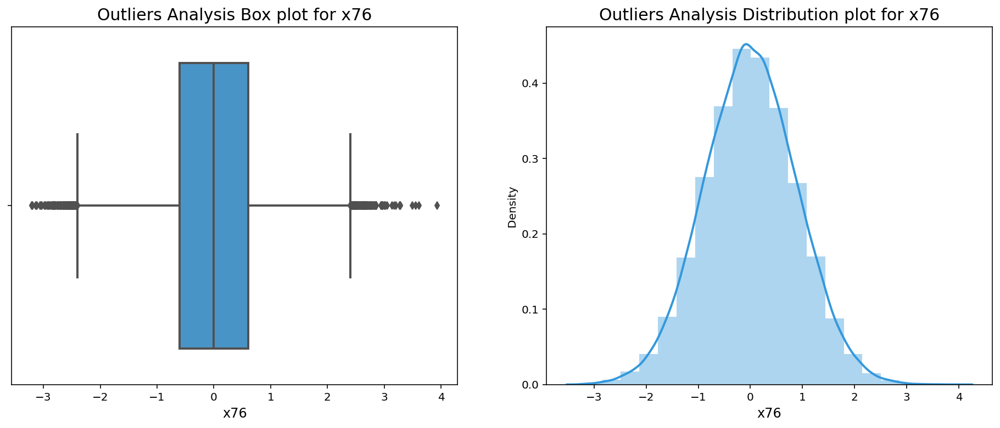

For feature x77. Upper bound : 30.26 Lower Bound: -30.50


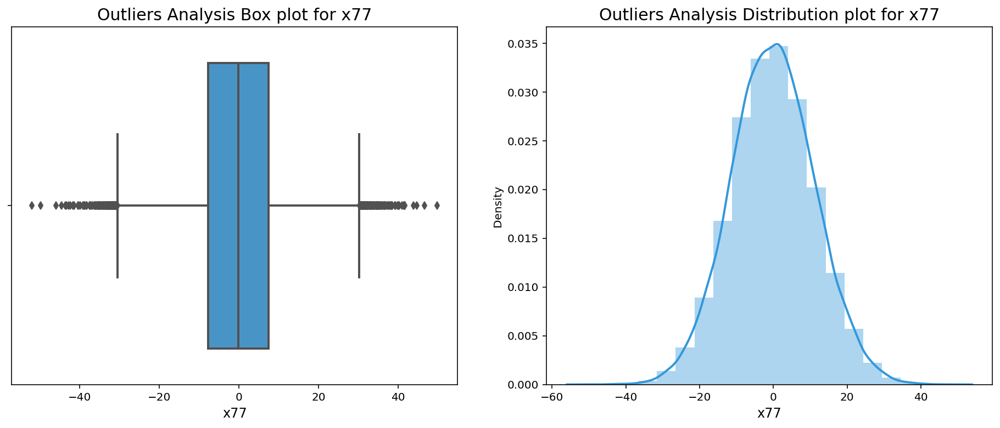

For feature x78. Upper bound : 12.74 Lower Bound: -14.57


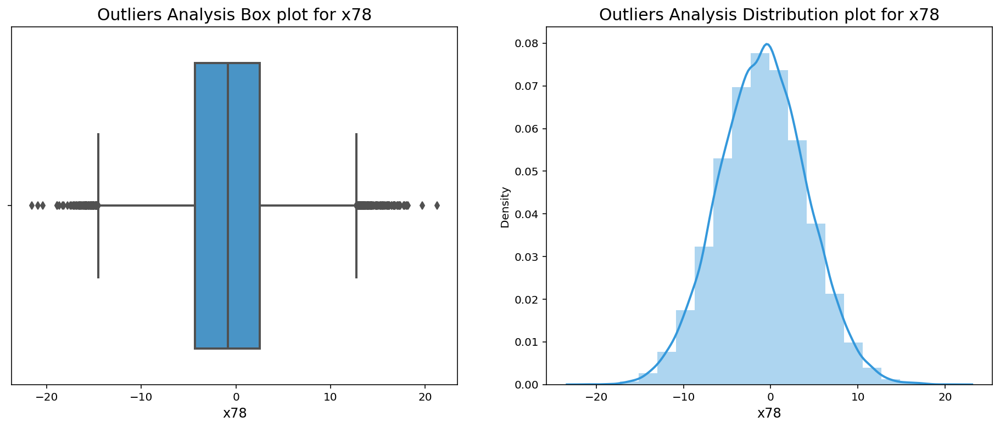

For feature x79. Upper bound : 43.79 Lower Bound: -42.11


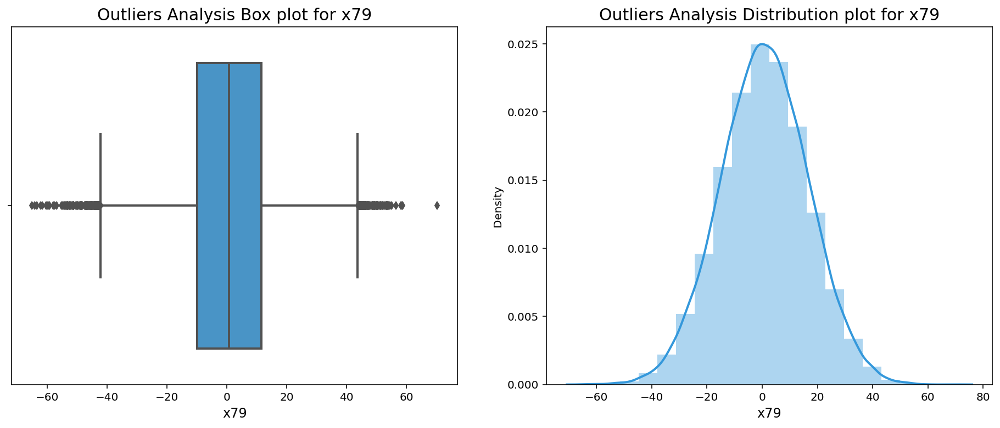

For feature x80. Upper bound : 70.41 Lower Bound: -70.78


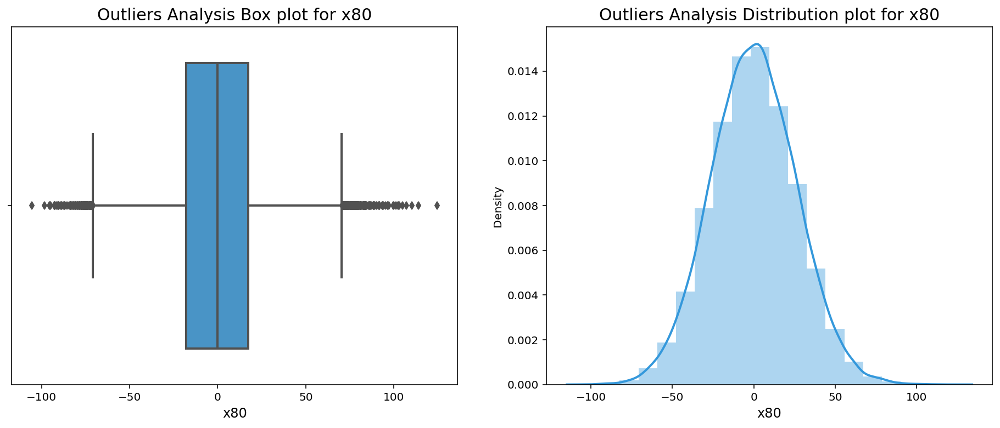

For feature x81. Upper bound : 0.79 Lower Bound: -0.79


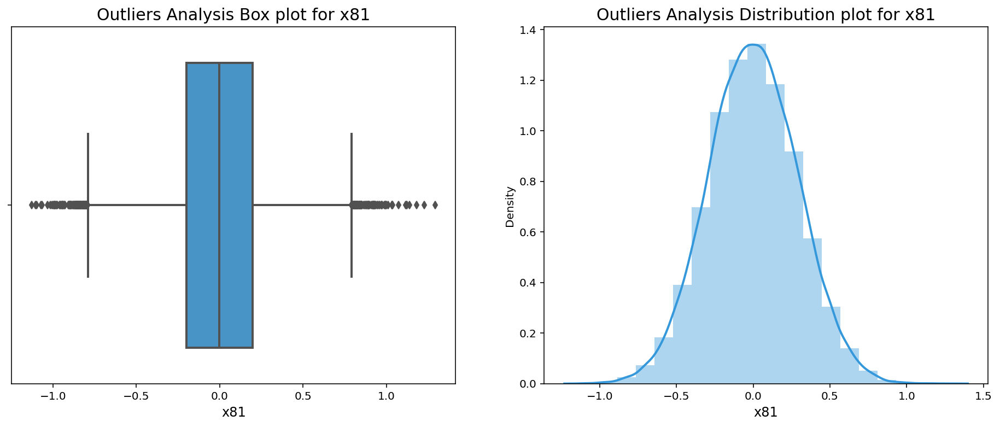

For feature x82. Upper bound : 23.46 Lower Bound: -23.41


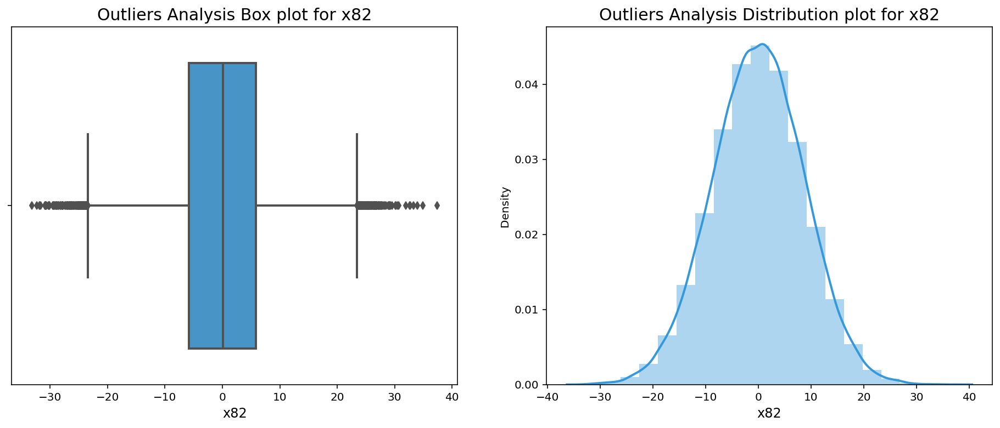

For feature x83. Upper bound : 64.04 Lower Bound: -61.71


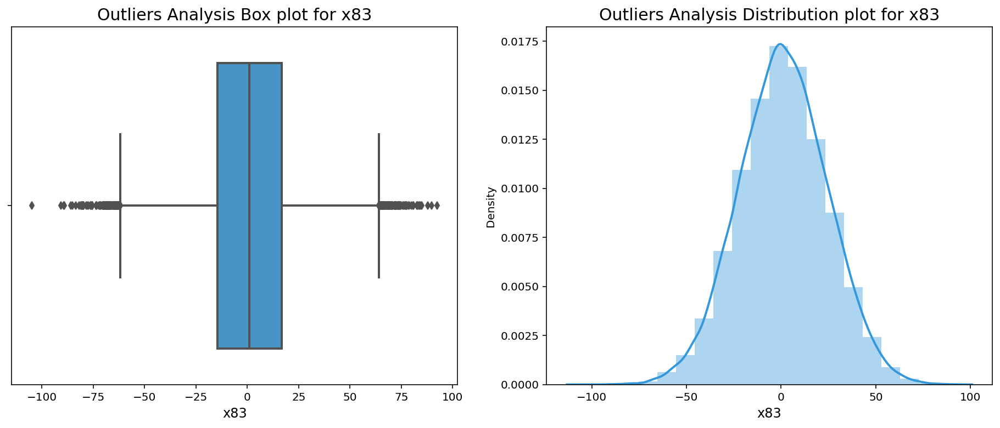

For feature x84. Upper bound : 14.36 Lower Bound: -14.39


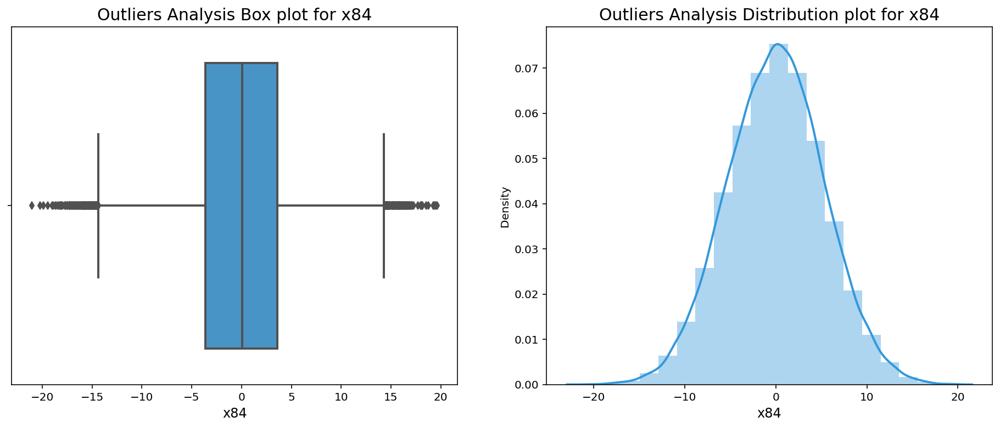

For feature x85. Upper bound : 27.38 Lower Bound: -31.65


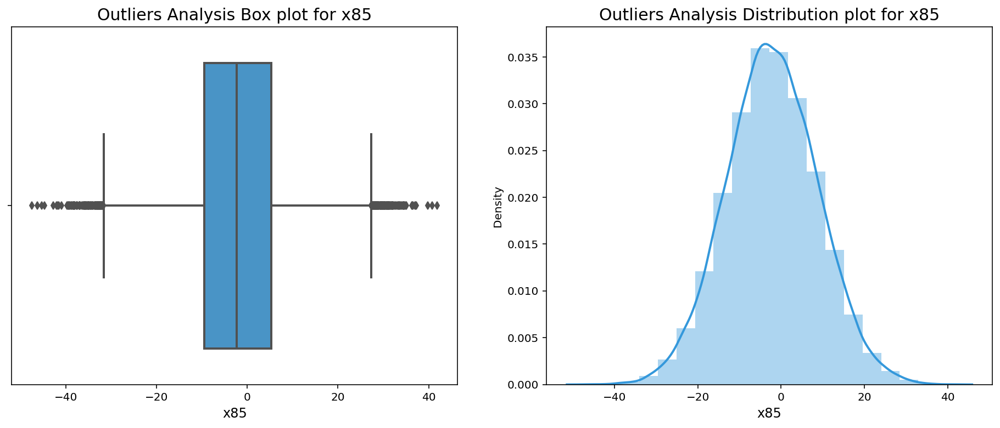

For feature x86. Upper bound : 16.10 Lower Bound: -16.03


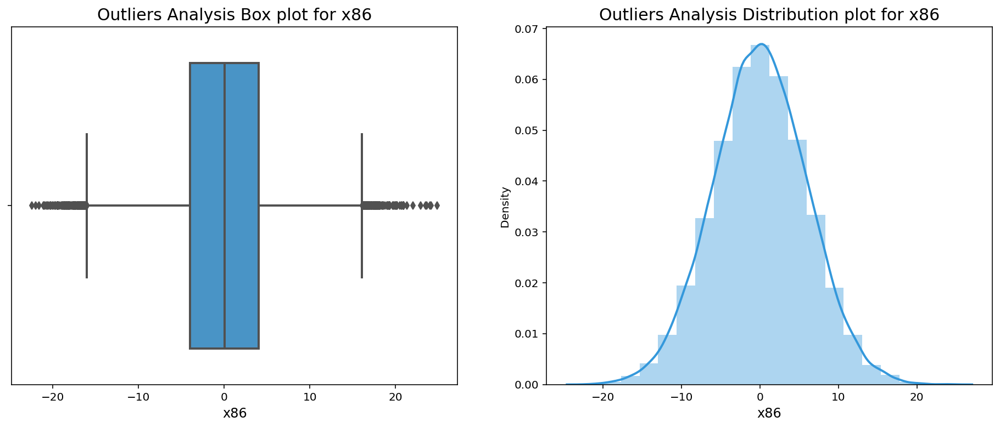

For feature x87. Upper bound : 3.53 Lower Bound: -3.52


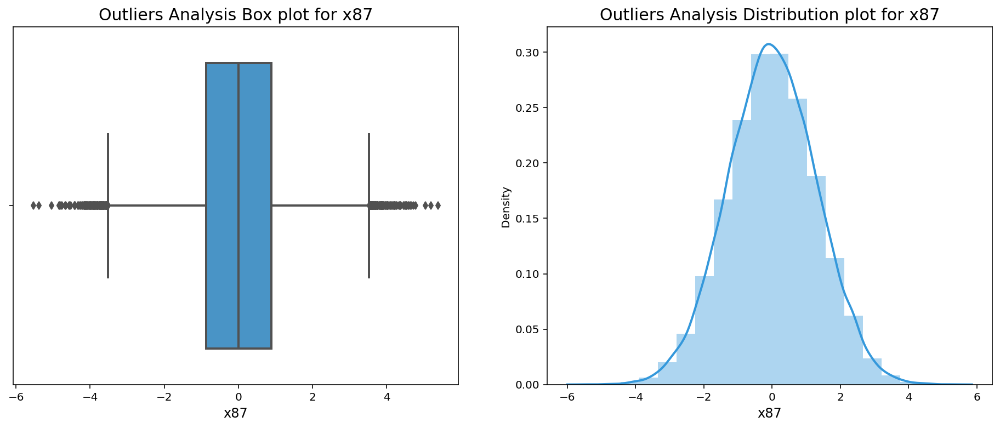

For feature x88. Upper bound : 20.83 Lower Bound: -20.80


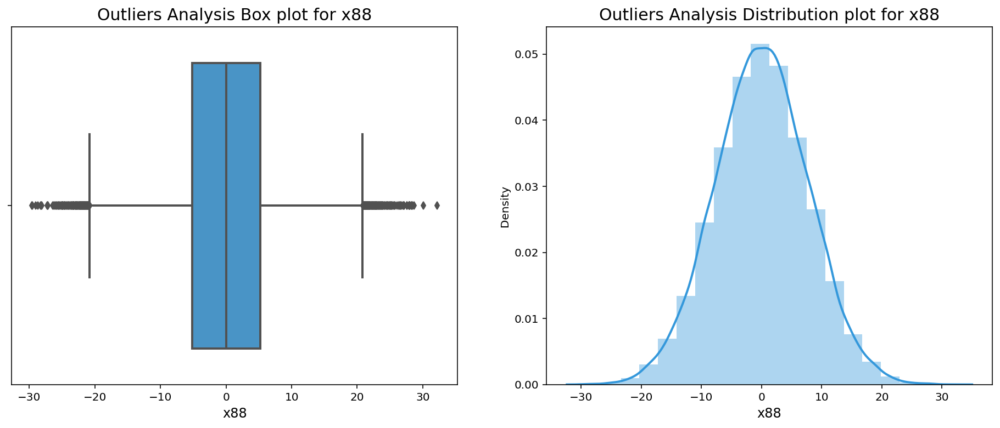

For feature x89. Upper bound : 20.57 Lower Bound: -20.47


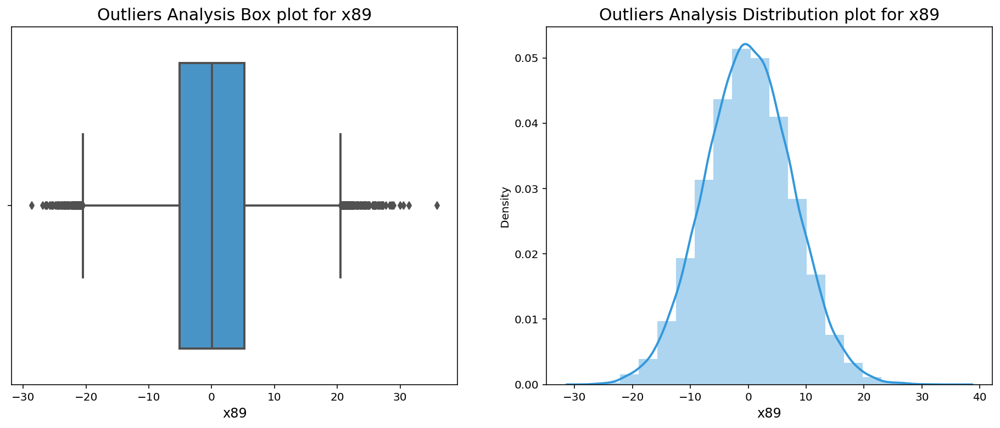

For feature x90. Upper bound : 400.18 Lower Bound: -426.72


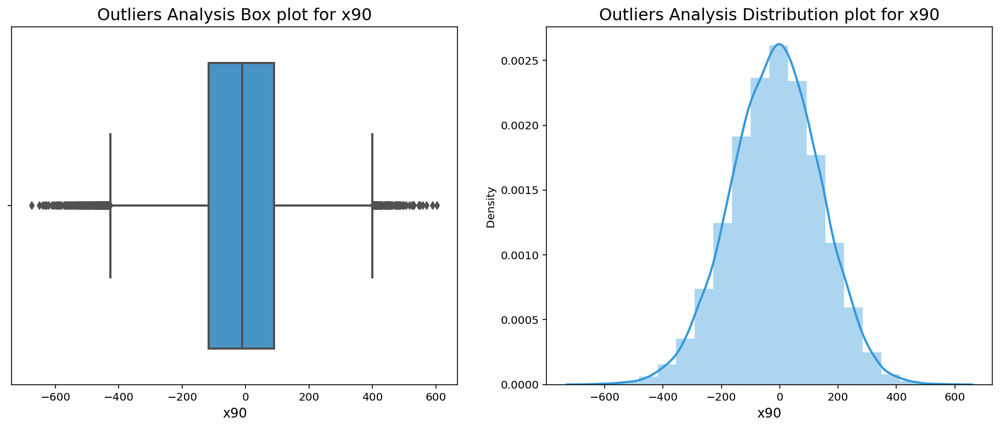

For feature x91. Upper bound : 8.92 Lower Bound: -8.90


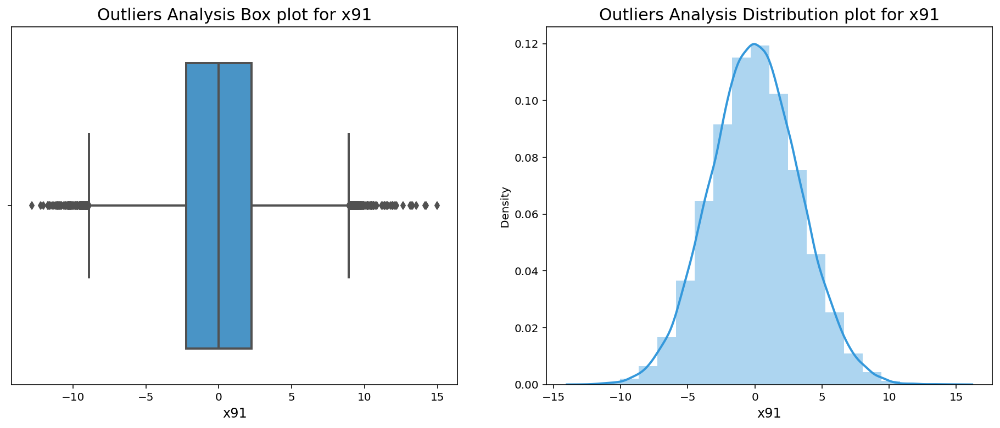

For feature x92. Upper bound : 23.66 Lower Bound: -23.67


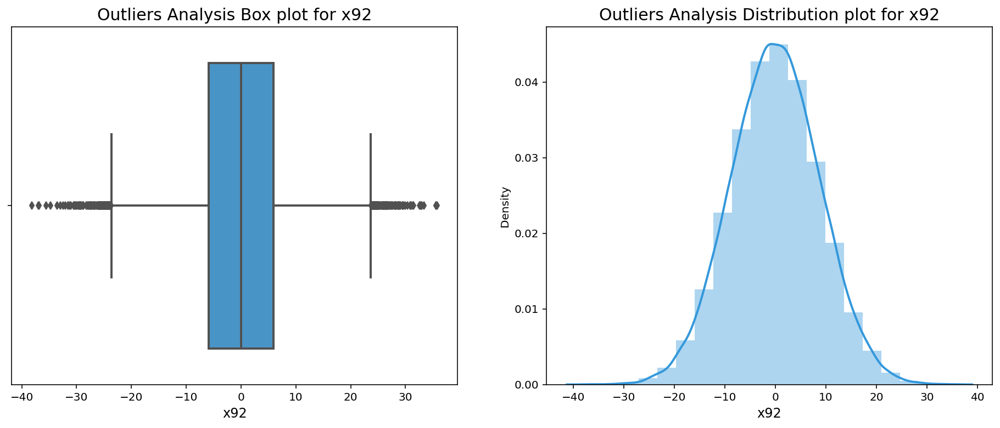

For feature x94. Upper bound : 13.40 Lower Bound: -13.53


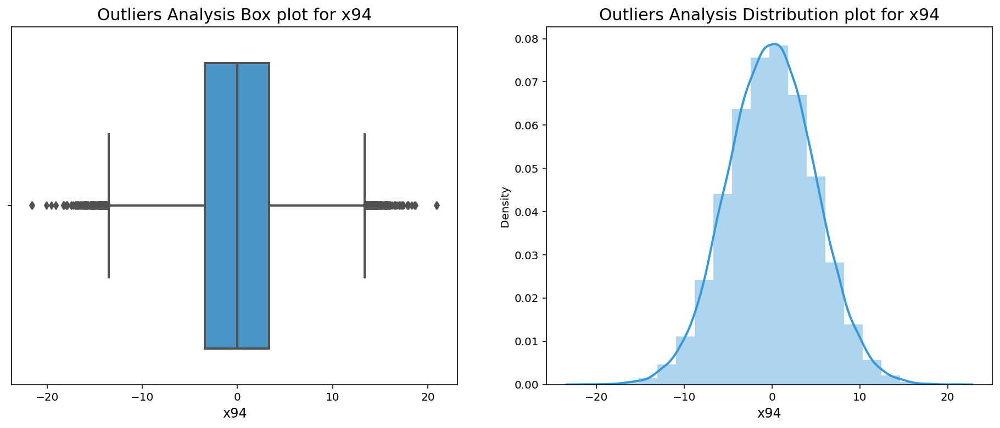

For feature x95. Upper bound : 51.81 Lower Bound: -51.71


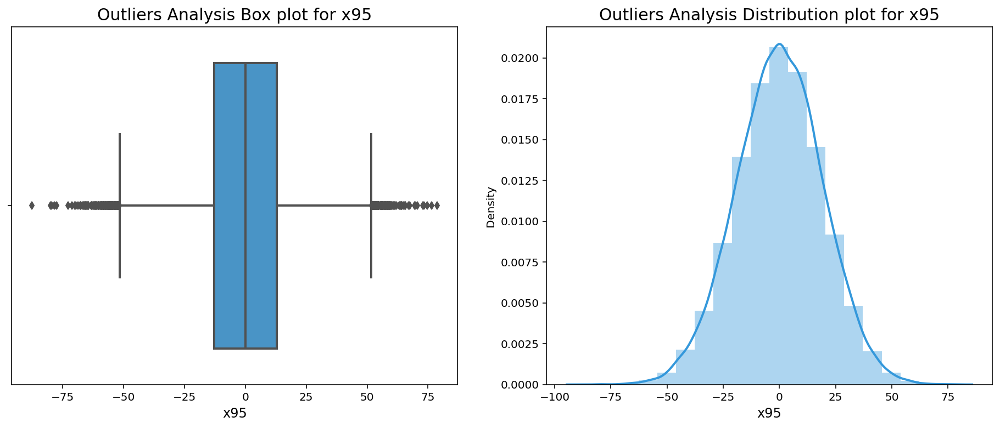

For feature x96. Upper bound : 44.88 Lower Bound: -46.04


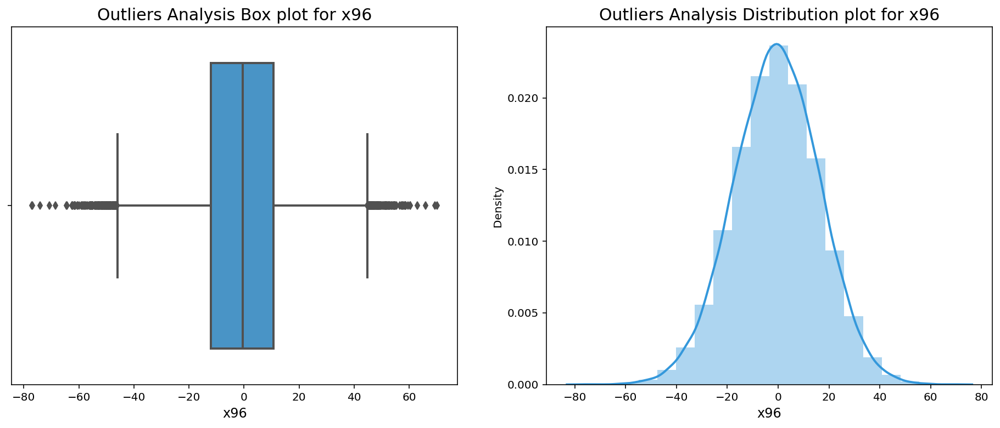

For feature x97. Upper bound : 36.55 Lower Bound: -40.62


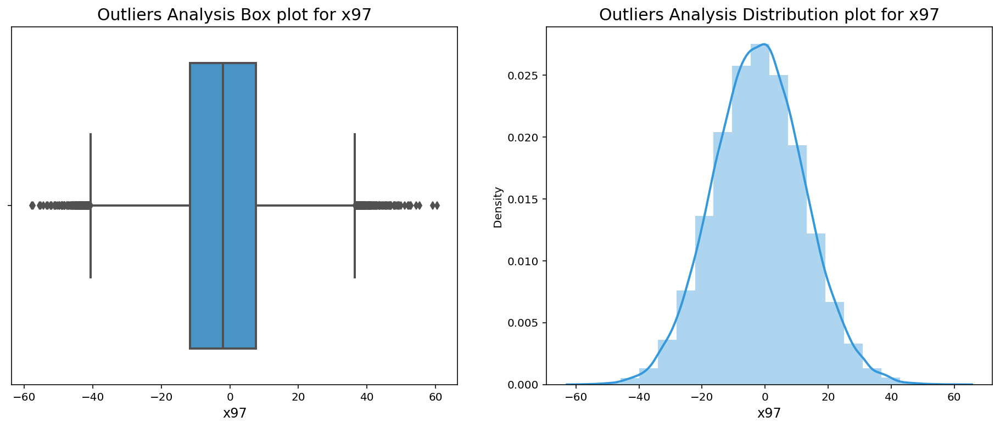

For feature x98. Upper bound : 15.25 Lower Bound: -15.18


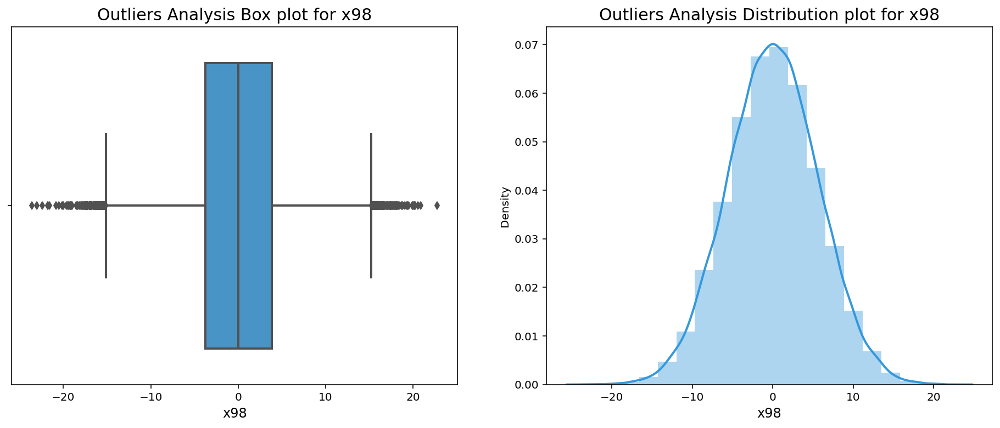

For feature x99. Upper bound : 101.65 Lower Bound: -98.66


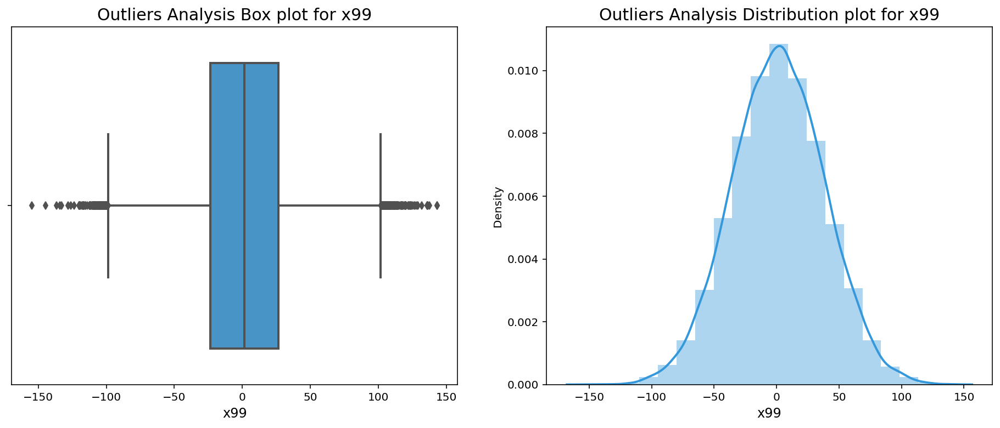

For feature y. Upper bound : 0.00 Lower Bound: 0.00


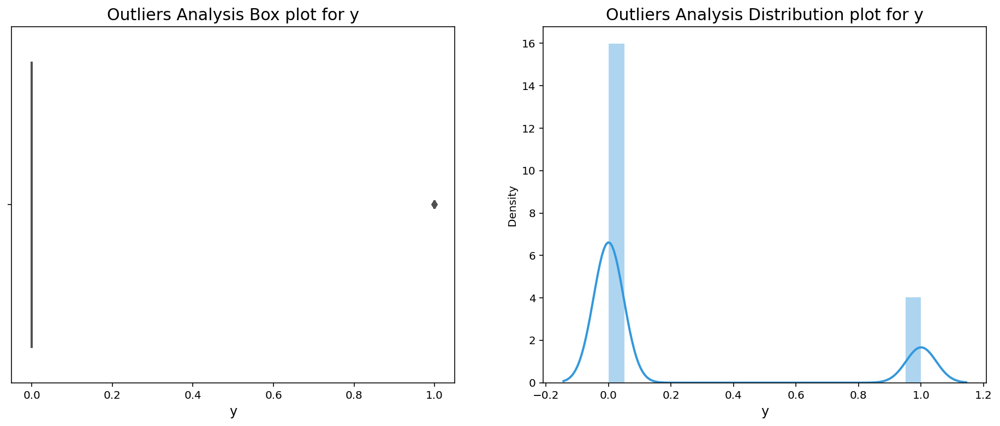

In [20]:
outlier_detection(training_df)

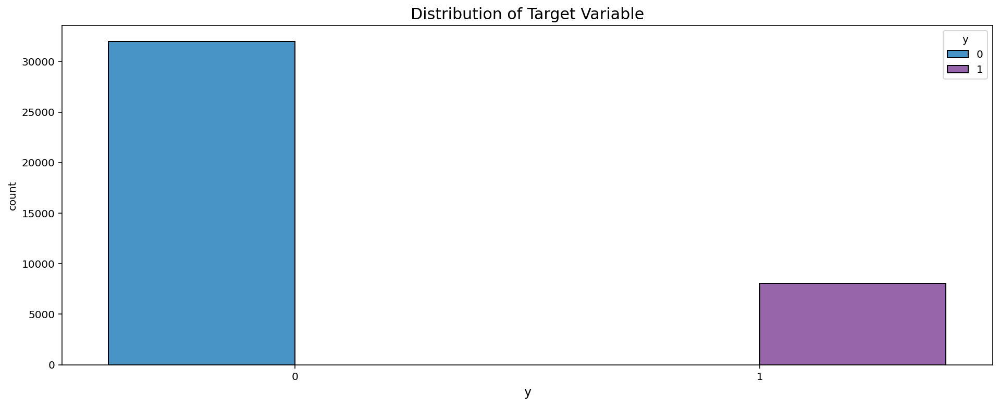

0    31953
1     8047
Name: y, dtype: int64

In [21]:
# plotting the target variable to check its distribution
plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='y',hue='y',edgecolor = "black")
plt.xlabel('y',fontsize=12)
plt.title('Distribution of Target Variable', fontsize=15)
plt.show()

training_df['y'].value_counts() # for values counts for each instance


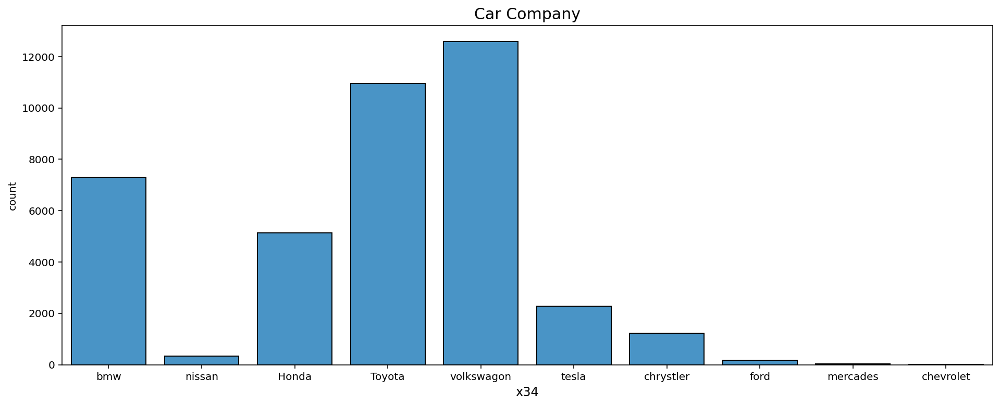

volkswagon    12579
Toyota        10946
bmw            7304
Honda          5129
tesla          2275
chrystler      1223
nissan          336
ford            165
mercades         32
chevrolet        11
Name: x34, dtype: int64

In [22]:
# Count plot to check distribution of variable x34
plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x34',edgecolor = "black",color='#3498db')
plt.xlabel('x34',fontsize=12)
plt.title('Distribution of x34', fontsize=15)
plt.show()

training_df['x34'].value_counts()

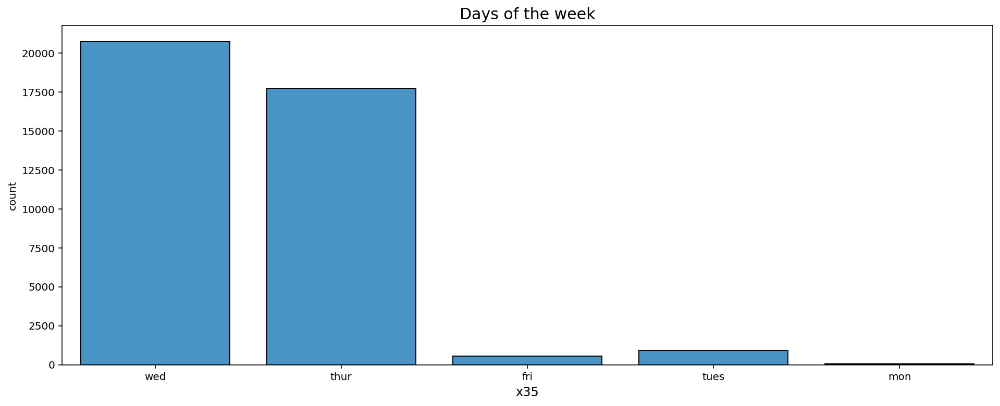

wed     20735
thur    17733
tues      929
fri       547
mon        56
Name: x35, dtype: int64

In [23]:
# Count plot to check distribution of variable x35

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x35',edgecolor = "black",color='#3498db')
plt.xlabel('x35',fontsize=12)
plt.title('Distribution of x35', fontsize=15)
plt.show()

training_df['x35'].value_counts() # values count of each oberservation

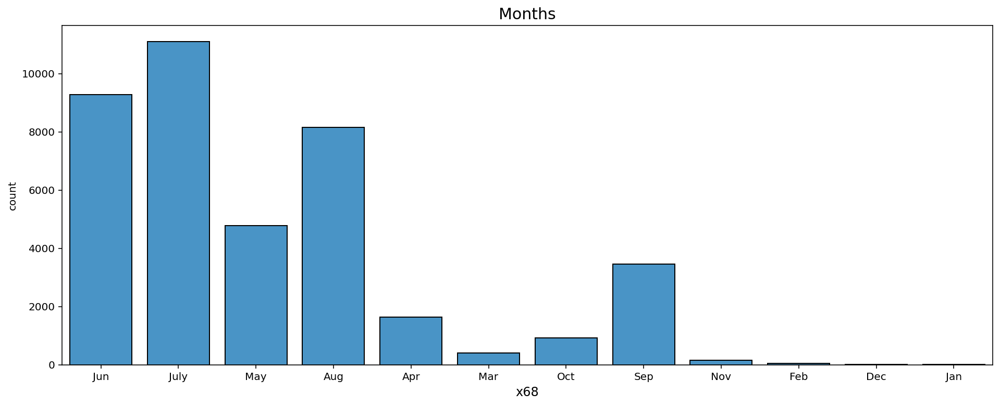

July    11097
Jun      9279
Aug      8155
May      4788
Sep      3466
Apr      1641
Oct       926
Mar       409
Nov       156
Feb        54
Dec        18
Jan        11
Name: x68, dtype: int64

In [24]:
# Count plot to check distribution of variable x68

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x68',edgecolor = "black",color='#3498db')
plt.xlabel('x68',fontsize=12)
plt.title('Distribution of x68', fontsize=15)
plt.show()

training_df['x68'].value_counts() # values count of each oberservation

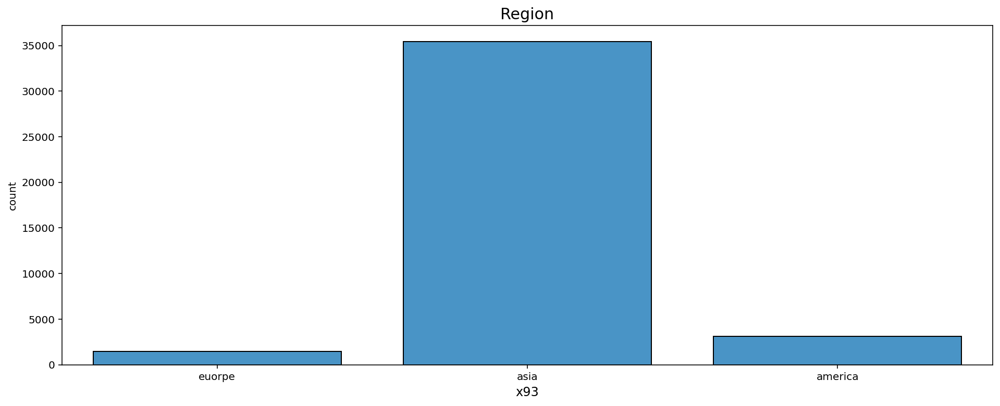

asia       35416
america     3136
euorpe      1448
Name: x93, dtype: int64

In [25]:
# Count plot to check distribution of variable x93

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x93',edgecolor = "black",color='#3498db')
plt.xlabel('x93',fontsize=12)
plt.title('Distribution of x93', fontsize=15)
plt.show()

training_df['x93'].value_counts() # values count of each oberservation

## Bi-variate Analysis

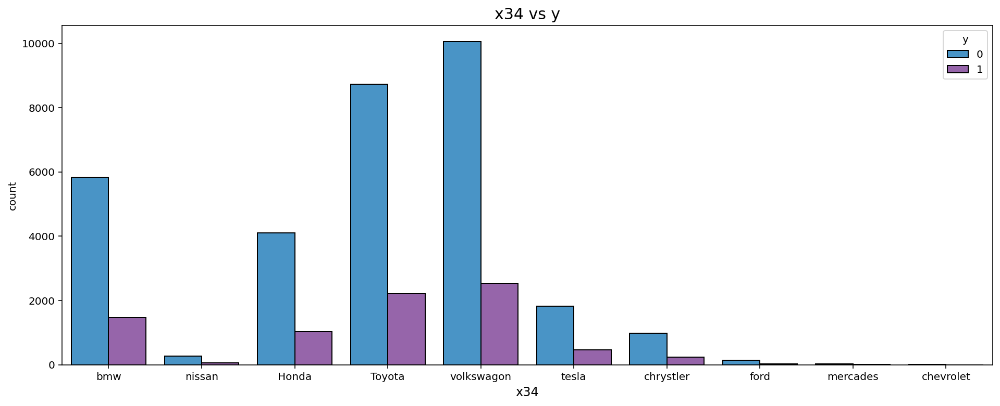

In [26]:
# Creating plot to understand how the target variable is divided acorss x34
plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x34',hue='y',edgecolor = "black");
plt.xlabel('x34',fontsize=12)
plt.title('x34 vs y', fontsize=15)
plt.show()

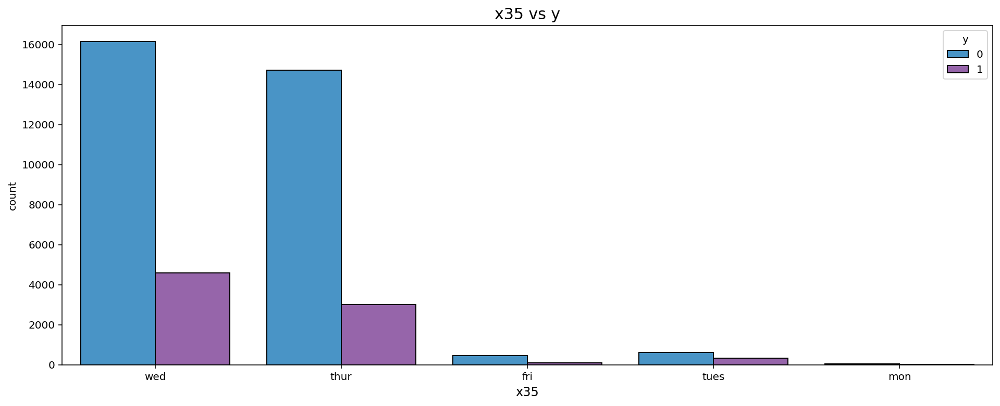

In [27]:
# Creating plot to understand how the target variable is divided acorss x35

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x35',hue='y',edgecolor = "black");
plt.xlabel('x35',fontsize=12)
plt.title('x35 vs y', fontsize=15)
plt.show()

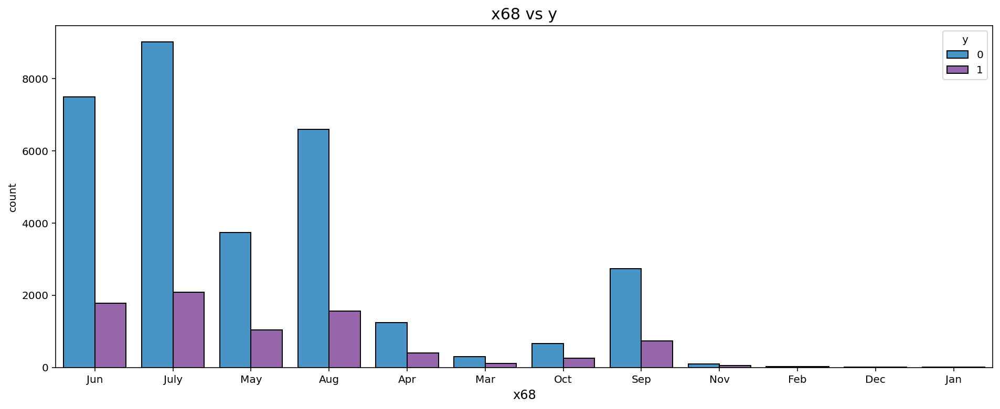

In [28]:
# Creating plot to understand how the target variable is divided acorss x68

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x68',hue='y',edgecolor = "black");
plt.xlabel('x68',fontsize=12)
plt.title('x68 vs y', fontsize=15)
plt.show()

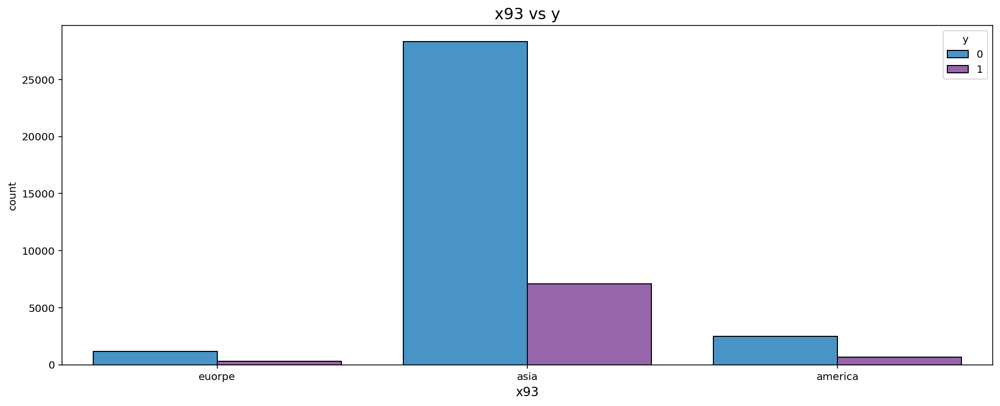

In [29]:
# Creating plot to understand how the target variable is divided acorss x93

plt.figure(figsize=(16,6))
sns.countplot(data=training_df,x='x93',hue='y',edgecolor = "black");
plt.xlabel('x93',fontsize=12)
plt.title('x93 vs y', fontsize=15)
plt.show()

In [30]:
num_df= training_df[numerical_cols]

In [31]:
num_df.drop(['y'],axis=1,inplace=True)

In [32]:
num_df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x94,x95,x96,x97,x98,x99
0,10.142889,-15.675620,3.583176,-22.397489,27.221894,-34.110924,-0.072829,-0.544444,0.997601,-2.691778,-0.923879,8.109456,27.872550,-3.420582,1.511710,6.673493,-4.323289,-1.538177,12.853393,-23.583975,-26.410490,2.328126,-28.226474,-4.131820,0.268103,-5.661808,-2.782330,30.276359,-0.944980,0.277266,-2.233740,0.515763,0.004137,-27.321975,5.613605,-8.771422,1.012030,-2.122949,0.500782,-54.10,-60.377200,-14.343129,-38.244485,0.00,-8.346880,0.300698,-3.560418,-29.858649,-0.004122,-1.034268,2.280323,-9.220175,-0.672959,-1.352266,19.547038,-6.706483,-16.123533,-5.271198,0.099280,-4.905632,0.557732,-3.858105,-0.074825,-11.258499,-44.973467,-4.274642,20.093447,8.887374,-0.061831,-23.493130,-14.127448,10.601780,-14.699572,0.105456,-7.410651,7.077637,-15.406388,-8.077094,0.099309,8.897077,16.018401,3.156413,9.127295,2.508565,0.298215,-1.502183,-10.945135,-151.134483,1.916575,5.240820,2.431170,0.454074,-18.572032,-14.291524,0.178579,18.110170
1,-52.214630,5.847135,-10.902843,-14.132351,20.588574,36.107322,0.115023,0.276093,-0.699168,-0.972708,1.287131,5.717183,-3.761334,-5.074973,-1.296964,-2.366536,-19.532219,-0.651274,-0.758730,-5.580162,47.151801,2.053410,-4.348193,-17.632414,-3.963233,-27.385429,1.991331,25.995571,-1.390032,-0.791795,2.537591,-1.138456,-1.202222,48.491336,-2.132043,1.288928,-1.622637,-0.919865,9.054563,-229.32,-280.208298,-46.045485,-7.783574,0.01,-2.248960,15.868349,-2.320347,29.611460,0.035378,-9.960903,0.662594,-40.051587,-7.467978,0.150334,13.798547,-19.627385,-28.046366,-8.330669,0.014509,-3.445528,0.109443,-4.855778,0.193892,4.110659,-93.785215,1.577921,9.645175,24.233527,-0.693696,11.269393,1.432276,2.241497,66.730645,-0.999038,-11.437920,5.797127,-24.134625,-56.489610,-0.010569,3.908027,37.616056,-2.317927,19.107566,0.254426,1.574185,-9.588623,-0.620432,-58.955871,0.370941,-3.794542,2.592326,31.921833,3.317139,10.037003,-1.930870,-3.486898
2,67.718500,2.064334,12.394186,-18.667102,47.465504,-50.373658,0.253707,1.068968,2.939713,2.691218,3.058585,7.537863,-19.130709,-0.906646,-2.794020,-3.978507,14.237849,1.373681,9.635405,-16.183555,16.922392,1.663092,-9.758591,-13.040577,-13.865584,4.965384,0.940166,16.305724,0.112402,-1.199571,1.286813,0.277410,0.682253,-6.741030,3.206642,-8.065741,0.838277,-0.465169,1.225612,243.68,-119.470071,25.462689,56.571522,-0.01,-2.161725,7.287187,-2.414766,-19.325576,0.865352,-8.971459,0.182888,25.383424,-4.359127,-0.198638,3.231385,-34.887447,-19.617867,2.782562,-0.737877,21.776265,-0.074349,0.956671,0.351399,0.655842,21.554429,16.279894,-21.659163,-1.974495,0.497966,-3.910715,2.961145,6.456046,-5.291719,-1.162664,0.826614,3.589234,4.451489,41.090029,-0.589545,0.019545,39.526904,1.184955,10.352987,6.747758,-1.042833,-7.050751,-7.780230,-74.014931,1.449817,12.470532,7.143821,9.401490,-10.604968,7.643215,-0.842198,-79.358236
3,-28.003111,8.565128,-8.592092,5.918960,-3.224154,78.315783,-0.879845,1.176889,-2.414752,0.589646,-0.906179,0.087087,25.075633,-0.834239,-0.027757,3.708857,-12.314642,2.700113,7.216934,74.438816,61.764811,-1.605895,-15.125777,5.556041,4.593257,-16.996278,-3.875344,5.064833,-1.296087,1.630619,-4.694258,-0.722119,-1.689241,-20.987787,-3.589886,4.368415,-1.045650,1.613660,-4.185118,126.15,129.270157,13.413693,115.018748,0.02,4.206076,-40.254305,0.049048,28.853906,0.263934,7.778529,3.748663,-1.119398,-13.652775,0.339680,-8.812638,14.877353,-18.611055,0.861688,1.615343,11.114677,-1.468676,-0.363571,1.527962,3.761182,43.310615,-7.075324,-0.785643,-7.698801,-1.216440,16.240854,14.623078,39.168353,5.417055,-0.789563,-12.464337,0.592219,6.482230,48.559408,-0.423049,-2.152232,-0.781164,2.811031,-16.8035

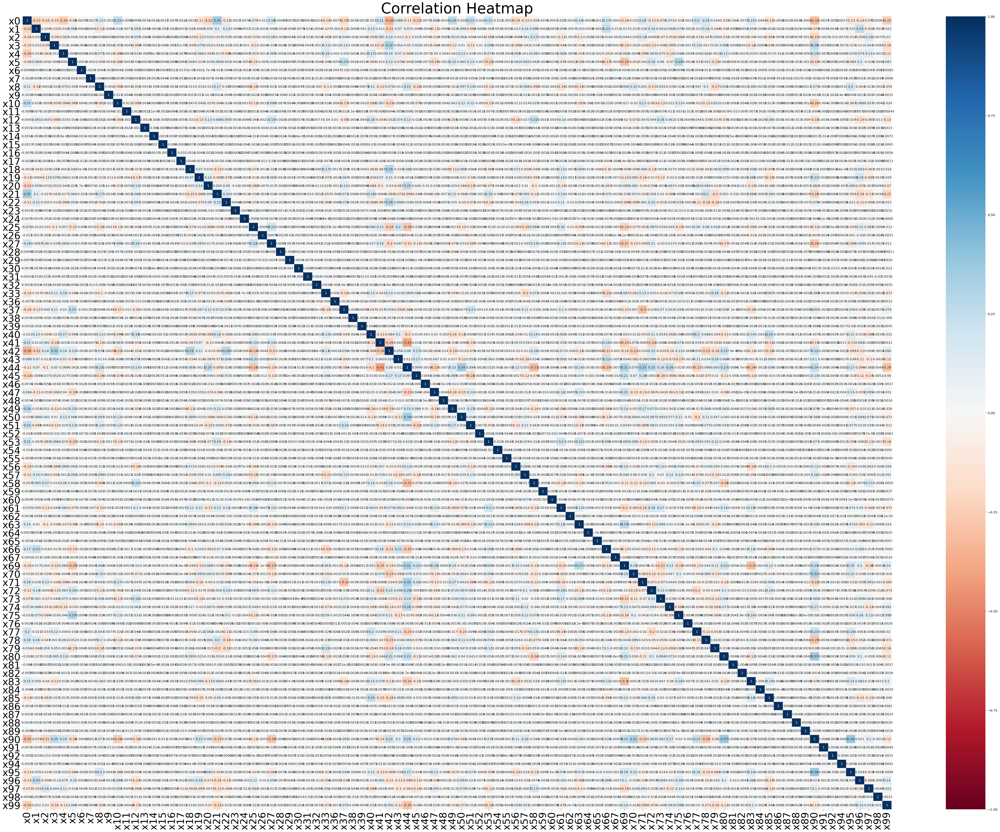

In [33]:
#Plotting the heatmap
plt.figure(figsize = (60, 45))
s = sns.heatmap(num_df.corr(),annot = True, cmap = 'RdBu', vmin = -1,vmax = 1)
s.set_yticklabels(s.get_yticklabels(), rotation = 0, fontsize = 30)
s.set_xticklabels(s.get_xticklabels(), rotation = 90, fontsize = 30)
plt.title('Correlation Heatmap',fontsize=45)
plt.show()

In [34]:
corr_matrix=num_df.corr() # Check the correlation 
corr_matrix=corr_matrix.abs().unstack() # unstacking the data for better understanding 
corr_matrix=corr_matrix.sort_values(ascending=False) # Sorting the data
corr_matrix=corr_matrix[(corr_matrix>=.40) & (corr_matrix<1)] # Filter out the data to check how many values are highly correlated 
corr_matrix=pd.DataFrame(corr_matrix) # putting data in dataframe

In [35]:
corr_matrix

,,0
x41,x44,0.408862
x44,x41,0.408862


Here I wanted to check the correlation between all the numerical variables, so that we can remove the highly correlated variable before creating model.

However the maximum positive correlation I can found was .40886 between x41 and X44 and decided not to remove any variables

In [36]:
# Removing target variable
numerical_cols.remove('y')

In [37]:
# Creating numerical varialbe dataframe
num_training_df=training_df[numerical_cols]

In [38]:
# Standardizing the numerical variables

scaler=StandardScaler()
std_num_training_df=scaler.fit_transform(num_training_df)
std_num_training_df=pd.DataFrame(std_num_training_df,columns=numerical_cols)

In [39]:
# Encoding the categorical variables
dummies=pd.get_dummies(training_df[categorical_cols])
dummies.head()

,x34_Honda,x34_Toyota,x34_bmw,x34_chevrolet,x34_chrystler,x34_ford,x34_mercades,x34_nissan,x34_tesla,x34_volkswagon,x35_fri,x35_mon,x35_thur,x35_tues,x35_wed,x68_Apr,x68_Aug,x68_Dec,x68_Feb,x68_Jan,x68_July,x68_Jun,x68_Mar,x68_May,x68_Nov,x68_Oct,x68_Sep,x93_america,x93_asia,x93_euorpe
0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
4,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [40]:
# Concating  both the dataframe and dropping the original categorical variables
final_training_data = pd.concat([std_num_training_df, dummies], axis = 1)
final_training_data

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x94,x95,x96,x97,x98,x99,x34_Honda,x34_Toyota,x34_bmw,x34_chevrolet,x34_chrystler,x34_ford,x34_mercades,x34_nissan,x34_tesla,x34_volkswagon,x35_fri,x35_mon,x35_thur,x35_tues,x35_wed,x68_Apr,x68_Aug,x68_Dec,x68_Feb,x68_Jan,x68_July,x68_Jun,x68_Mar,x68_May,x68_Nov,x68_Oct,x68_Sep,x93_america,x93_asia,x93_euorpe
0,0.049077,-0.819157,0.103215,-1.422126,0.637794,-0.767776,-0.068111,-0.156218,0.559408,-1.404334,-0.800863,1.255894,1.179883,-1.145976,0.887804,0.743483,-0.437287,-0.671949,1.683981,-0.662547,-0.877501,1.167176,-1.397201,-0.498822,0.026620,-0.225624,-0.706499,1.467203,-0.413297,0.177566,-0.608362,0.467456,0.000028,-0.560002,0.605384,-1.097168,0.752969,-1.330750,0.025685,-0.055835,-0.351468,-0.627458,-0.133521,0.002086,-2.310248,0.012385,-2.212129,-0.784529,-0.199778,0.088467,0.553838,-0.401925,-0.059899,-1.452643,2.802067,-0.208006,-0.604934,-0.603130,0.129851,-0.262596,0.165554,-0.793291,-0.056643,-1.478213,-1.362495,-0.437559,0.811522,0.249674,-0.062552,-0.958004,-0.486099,0.264157,-0.536756,0.114366,-0.648506,1.572777,-1.017711,-0.306253,0.341952,1.027296,0.636643,0.595806,1.030570,0.413432,0.226962,-0.195876,-1.442373,-0.888568,0.575425,0.597600,0.498435,0.023999,-1.060960,-0.856036,0.025228,0.450247,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,-1.576214,0.599703,-0.482552,-0.879211,0.480742,0.899391,0.108135,0.086397,-0.016312,-0.502553,0.669443,0.884818,0.125510,-1.701196,-0.764591,-0.269650,-1.981140,-0.283276,-0.361962,-0.159615,1.036941,1.007724,-0.169524,-2.150243,-0.400166,-1.066198,0.504767,1.226364,-0.611858,-0.521420,0.704278,-1.040345,-1.241032,1.534329,-0.234365,-0.007893,-1.218010,-0.580178,1.376738,-0.230806,-1.725042,-2.026472,0.170983,0.960915,-0.620859,0.698376,-1.444243,0.776179,-0.114947,-0.697564,0.159536,-1.714564,-0.759490,0.152884,1.992754,-0.614070,-1.159459,-0.953971,0.017355,-0.185080,0.034090,-1.046483,0.137288,0.546751,-2.906077,0.165978,0.447749,1.007806,-0.645690,0.759715,0.253736,0.052046,1.591954,-1.122618,-1.004961,1.319879,-1.565742,-2.153982,-0.037508,0.452309,1.560945,-0.436328,1.941851,0.038037,1.209828,-1.237588,-0.090204,-0.290094,0.108596,-0.433460,0.530803,1.659853,0.233350,0.836475,-0.349278,-0.134717,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,1.549732,0.350327,0.459503,-1.177086,1.117088,-1.153896,0.238251,0.320833,1.218373,1.419451,1.847447,1.167232,-0.386759,-0.302290,-1.645338,-0.450306,1.446848,0.604131,1.200308,-0.455818,0.250228,0.781173,-0.447694,-1.588560,-1.398946,0.185585,0.238045,0.681208,0.058455,-0.788037,0.360176,0.250200,0.697650,0.008544,0.344432,-1.020761,0.622985,-0.296506,0.140170,0.241521,-0.720699,1.129161,0.814312,-0.956744,-0.596691,0.320246,-1.502710,-0.508104,1.667525,-0.610439,0.042613,1.071313,-0.439414,-0.219993,0.505033,-1.093646,-0.767454,0.320424,-0.981102,1.153931,-0.019809,0.428615,0.250960,0.091561,0.741328,1.682097,-0.642160,-0.286925,0.454075,0.009621,0.326430,0.158975,-0.290821,-1.305873,0.080577,0.883824,0.229133,1.570277,-2.036991,0.004162,1.642722,0.224107,1.142486,1.119411,-0.806032,-0.910654,-1.027883,-0.387865,0.434450,1.422610,1.444952,0.489131,-0.589867,0.669941,-0.155998,-2.189718,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,-0.945163,0.778883,-0.389112,0.437906,-0.083056,1.901532,-0.825270,0.352743,-0.598416,0.317019,-0.789093,0.011508,1.086660,-0.277989,-0.017893,0.411231,-1.248486,1.185420,0.836804,2.075697,1.417242,-1.116234,-0.723642,0.686217,0.462868,-0.664200,-0.983840,0.048789,-0.569944,1.062433,-1.285275,-0.660859,-1.742060,-0.385021,-0.392418,0.325536,-0.786369,1.000422,-0.714444,0.124158,0.833508,0.597442,1.398582,1.919745,

In [41]:
final_training_data.shape

(40000, 126)

## Preparing Training Data

In [42]:
X=final_training_data
y=training_df['y']

In [43]:
X

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x94,x95,x96,x97,x98,x99,x34_Honda,x34_Toyota,x34_bmw,x34_chevrolet,x34_chrystler,x34_ford,x34_mercades,x34_nissan,x34_tesla,x34_volkswagon,x35_fri,x35_mon,x35_thur,x35_tues,x35_wed,x68_Apr,x68_Aug,x68_Dec,x68_Feb,x68_Jan,x68_July,x68_Jun,x68_Mar,x68_May,x68_Nov,x68_Oct,x68_Sep,x93_america,x93_asia,x93_euorpe
0,0.049077,-0.819157,0.103215,-1.422126,0.637794,-0.767776,-0.068111,-0.156218,0.559408,-1.404334,-0.800863,1.255894,1.179883,-1.145976,0.887804,0.743483,-0.437287,-0.671949,1.683981,-0.662547,-0.877501,1.167176,-1.397201,-0.498822,0.026620,-0.225624,-0.706499,1.467203,-0.413297,0.177566,-0.608362,0.467456,0.000028,-0.560002,0.605384,-1.097168,0.752969,-1.330750,0.025685,-0.055835,-0.351468,-0.627458,-0.133521,0.002086,-2.310248,0.012385,-2.212129,-0.784529,-0.199778,0.088467,0.553838,-0.401925,-0.059899,-1.452643,2.802067,-0.208006,-0.604934,-0.603130,0.129851,-0.262596,0.165554,-0.793291,-0.056643,-1.478213,-1.362495,-0.437559,0.811522,0.249674,-0.062552,-0.958004,-0.486099,0.264157,-0.536756,0.114366,-0.648506,1.572777,-1.017711,-0.306253,0.341952,1.027296,0.636643,0.595806,1.030570,0.413432,0.226962,-0.195876,-1.442373,-0.888568,0.575425,0.597600,0.498435,0.023999,-1.060960,-0.856036,0.025228,0.450247,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,-1.576214,0.599703,-0.482552,-0.879211,0.480742,0.899391,0.108135,0.086397,-0.016312,-0.502553,0.669443,0.884818,0.125510,-1.701196,-0.764591,-0.269650,-1.981140,-0.283276,-0.361962,-0.159615,1.036941,1.007724,-0.169524,-2.150243,-0.400166,-1.066198,0.504767,1.226364,-0.611858,-0.521420,0.704278,-1.040345,-1.241032,1.534329,-0.234365,-0.007893,-1.218010,-0.580178,1.376738,-0.230806,-1.725042,-2.026472,0.170983,0.960915,-0.620859,0.698376,-1.444243,0.776179,-0.114947,-0.697564,0.159536,-1.714564,-0.759490,0.152884,1.992754,-0.614070,-1.159459,-0.953971,0.017355,-0.185080,0.034090,-1.046483,0.137288,0.546751,-2.906077,0.165978,0.447749,1.007806,-0.645690,0.759715,0.253736,0.052046,1.591954,-1.122618,-1.004961,1.319879,-1.565742,-2.153982,-0.037508,0.452309,1.560945,-0.436328,1.941851,0.038037,1.209828,-1.237588,-0.090204,-0.290094,0.108596,-0.433460,0.530803,1.659853,0.233350,0.836475,-0.349278,-0.134717,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
2,1.549732,0.350327,0.459503,-1.177086,1.117088,-1.153896,0.238251,0.320833,1.218373,1.419451,1.847447,1.167232,-0.386759,-0.302290,-1.645338,-0.450306,1.446848,0.604131,1.200308,-0.455818,0.250228,0.781173,-0.447694,-1.588560,-1.398946,0.185585,0.238045,0.681208,0.058455,-0.788037,0.360176,0.250200,0.697650,0.008544,0.344432,-1.020761,0.622985,-0.296506,0.140170,0.241521,-0.720699,1.129161,0.814312,-0.956744,-0.596691,0.320246,-1.502710,-0.508104,1.667525,-0.610439,0.042613,1.071313,-0.439414,-0.219993,0.505033,-1.093646,-0.767454,0.320424,-0.981102,1.153931,-0.019809,0.428615,0.250960,0.091561,0.741328,1.682097,-0.642160,-0.286925,0.454075,0.009621,0.326430,0.158975,-0.290821,-1.305873,0.080577,0.883824,0.229133,1.570277,-2.036991,0.004162,1.642722,0.224107,1.142486,1.119411,-0.806032,-0.910654,-1.027883,-0.387865,0.434450,1.422610,1.444952,0.489131,-0.589867,0.669941,-0.155998,-2.189718,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,-0.945163,0.778883,-0.389112,0.437906,-0.083056,1.901532,-0.825270,0.352743,-0.598416,0.317019,-0.789093,0.011508,1.086660,-0.277989,-0.017893,0.411231,-1.248486,1.185420,0.836804,2.075697,1.417242,-1.116234,-0.723642,0.686217,0.462868,-0.664200,-0.983840,0.048789,-0.569944,1.062433,-1.285275,-0.660859,-1.742060,-0.385021,-0.392418,0.325536,-0.786369,1.000422,-0.714444,0.124158,0.833508,0.597442,1.398582,1.919745,

In [44]:
y

0        0
1        0
2        0
3        0
4        0
        ..
39995    0
39996    0
39997    0
39998    0
39999    1
Name: y, Length: 40000, dtype: int64

## Preparing Test Data

In [45]:
initial_analysis(testing_df) # Calling initial analysis function

# Cleaning the requried variable and changing the data types from obj to float

testing_df['x41'] = testing_df['x41'].str.replace('$','').astype(float)
testing_df['x45'] = testing_df['x45'].str.replace('%','').astype(float)

# Calling the function to handel missing values
handling_missing_value(testing_df)

# Making the variable data uniform 
testing_df['x35'] = testing_df['x35'].replace({'wednesday': 'wed',
                                                 'thurday': 'thur',
                                                 'friday': 'fri',
                                                 'tuesday':'tues',
                                                 'monday':'mon'})

testing_df['x68'] = testing_df['x68'].replace({'sept.': 'Sep',
                                                 'Dev': 'Dec',
                                                 'January': 'Jan'
                                                 })

categorical_cols=list(testing_df.select_dtypes(include=['object'])) # Creating list of categorical variables
numerical_cols=list(testing_df.select_dtypes(include=['number'])) # Creating List of numerical variables

num_testing_df=testing_df[numerical_cols]# Selecting only numerical variables in Dataframe

# Standardization to have uniformity in the data

scaler=StandardScaler()
std_num_testing_df=scaler.fit_transform(num_testing_df)
std_num_testing_df=pd.DataFrame(std_num_testing_df,columns=numerical_cols)

# Encoding the categorical data
dummies=pd.get_dummies(testing_df[categorical_cols])

# Creating final dataset by concatinating the standardized 
## numeric variables and encoded categorical varialbes

final_testing_df = pd.concat([std_num_testing_df, dummies], axis = 1)


 The shape of the dataset:(10000, 100)

 Number of columns in the dataset:100

 Number of rows in the dataset:10000
*********************************************
 Number of Numerical Features : 94

 Number of Categorical Features : 6
****************************************
 Number of missing values :
 
x0     0
x1     2
x2     3
x3     3
x4     2
x5     1
x6     4
x7     0
x8     1
x9     2
x10    3
x11    0
x12    1
x13    4
x14    2
x15    1
x16    1
x17    2
x18    1
x19    1
x20    1
x21    2
x22    2
x23    0
x24    5
x25    3
x26    0
x27    1
x28    1
x29    1
x30    0
x31    2
x32    3
x33    3
x34    2
x35    3
x36    2
x37    3
x38    0
x39    2
x40    2
x41    1
x42    3
x43    1
x44    1
x45    2
x46    4
x47    2
x48    4
x49    0
x50    2
x51    2
x52    3
x53    2
x54    0
x55    3
x56    1
x57    2
x58    3
x59    2
x60    2
x61    3
x62    3
x63    2
x64    1
x65    2
x66    1
x67    2
x68    2
x69    1
x70    2
x71    2
x72    2
x73    7
x74    3
x75    2
x76    4
x

In [48]:
final_testing_df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20,x21,x22,x23,x24,x25,x26,x27,x28,x29,x30,x31,x32,x33,x36,x37,x38,x39,x40,x41,x42,x43,x44,x45,x46,x47,x48,x49,x50,x51,x52,x53,x54,x55,x56,x57,x58,x59,x60,x61,x62,x63,x64,x65,x66,x67,x69,x70,x71,x72,x73,x74,x75,x76,x77,x78,x79,x80,x81,x82,x83,x84,x85,x86,x87,x88,x89,x90,x91,x92,x94,x95,x96,x97,x98,x99,x34_Honda,x34_Toyota,x34_bmw,x34_chevrolet,x34_chrystler,x34_ford,x34_mercades,x34_nissan,x34_tesla,x34_volkswagon,x35_fri,x35_mon,x35_thur,x35_tues,x35_wed,x68_Apr,x68_Aug,x68_Dec,x68_Feb,x68_Jan,x68_July,x68_Jun,x68_Mar,x68_May,x68_Nov,x68_Oct,x68_Sep,x93_america,x93_asia,x93_euorpe
0,-0.809655,0.083978,0.455701,-0.218952,-1.460581,-0.519840,-1.860407,-0.185925,-1.245861,-2.487486,0.459178,-1.219735,-0.058645,-1.940809,-0.686300,0.552115,-0.415342,0.428003,-0.313929,-1.435418,0.339865,-1.023480,2.581637,0.371332,2.504139,0.355027,0.264592,-0.134841,-1.036727,0.563378,0.809517,1.775153,-0.817488,0.349575,0.735701,1.722794,-1.111143,-0.831186,0.668519,-1.072948,0.214291,0.669795,-1.061887,0.962209,0.345846,0.927969,-0.425115,-0.549751,-1.813384,0.012644,0.284649,-0.257571,0.047174,0.537550,-0.252996,-0.130060,0.372412,0.706202,-0.514450,0.269954,-1.127942,0.478539,0.182548,-0.413333,0.730030,0.770104,-0.126233,-1.442910,0.932638,-0.643527,-0.484219,-0.316573,-1.299046,1.374138,0.466966,0.979112,-0.627528,-1.464525,-1.056996,-1.449866,-0.782619,-0.668560,1.142680,0.130122,0.787129,2.080213,0.937119,-1.224059,0.455540,-0.932490,0.680182,-0.532399,-1.034498,-0.295830,-0.870734,1.257087,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
1,3.430985,0.275291,-0.844798,-1.096892,-1.846032,1.770566,-0.401723,0.420842,-1.608500,0.036963,3.429102,-1.334217,-1.054025,1.672801,1.812281,0.213663,0.353941,-0.114324,1.033217,1.102779,0.497827,2.077022,-0.955803,-0.804226,-0.750920,-0.572506,-0.445234,0.909149,-1.488935,-1.757352,0.309959,-0.173455,-0.566246,-2.188749,1.399502,1.161587,-1.129015,0.091319,-1.948853,1.793916,-1.899448,0.260134,-2.721082,0.962209,-0.682911,1.321394,0.356705,0.980234,-2.005513,-0.249052,-0.812605,0.899370,-0.206137,-0.262864,-0.677970,-0.819913,-0.307411,-0.463787,1.147482,-0.373659,-1.646928,1.699638,-1.241504,-2.336422,1.706616,-1.021247,-0.729639,0.637985,-1.242260,-1.633108,-1.844006,-0.956636,-0.348709,-1.162090,0.461138,-0.250619,-0.378368,-0.176843,0.061022,-0.902451,-0.641976,-0.528762,-0.930116,0.519591,0.563007,-0.159214,1.056919,-2.024227,1.686715,-0.235801,-1.058263,-2.708704,-0.025349,-1.301381,-0.657388,-0.998107,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,-0.443028,-0.466735,-0.348516,0.253324,-0.367156,0.773906,-0.363734,0.779358,0.767772,2.576910,0.806339,1.700215,-1.606386,2.048687,1.093522,0.289714,-2.345004,0.570428,-0.674995,-0.229517,0.036798,-0.441568,-1.333642,-1.403143,1.686087,-0.624101,-0.539206,0.397261,-0.646290,0.801568,2.436075,0.489945,-0.213974,-0.630170,0.095110,1.476690,0.470416,0.424527,-1.131697,0.708758,0.362876,-0.108781,0.352453,-0.003090,0.475889,0.268998,0.105415,-0.107426,0.255685,0.694386,1.247824,0.707186,-0.940182,0.339070,1.472473,1.050009,1.022358,0.706243,1.436336,-0.124688,-0.239904,-0.597739,0.583183,-1.722230,1.268997,-0.572665,-0.083428,-0.949448,-0.576517,0.646707,-0.045263,-0.358733,0.713840,-0.575061,-0.604504,0.571267,0.200974,0.746342,0.842015,-0.571776,-0.446227,1.236529,0.478903,-0.094256,-1.739555,-1.669814,0.925033,0.262561,-0.287209,1.167172,1.591305,0.985386,0.500108,0.607770,-0.191255,0.942108,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,0.034178,1.355597,0.516496,-1.069508,-0.811543,0.501108,-1.157267,1.664396,-1.099853,1.451819,0.986521,1.167904,-0.662015,1.771972,0.522509,-0.836102,1.805342,0.250136,0.357811,0.227516,-0.118708,0.191749,-0.441993,-0.351812,-0.405878,0.512187,-2.256241,0.032649,-2.123867,-0.616262,-0.897710,1.193259,-0.209830,0.689133,0.088997,-0.011023,-1.285211,1.543579,-2.813993,-0.128055,-0.780474,-0.654114,-1.020517

## Creating Baseline Model

### Splitting the training and test data 

In [55]:
# Splitting the data into training and test data

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

X_train.shape,X_test.shape,y_train.shape,y_test.shape # Checking the shape of the data

((32000, 126), (8000, 126), (32000,), (8000,))

In [83]:
## Creating function for metric

def metrics(y_test,y_pred):
    
    """
    This function shows all the metrics for classification model
    """
    from sklearn.metrics import accuracy_score
    from sklearn. metrics import classification_report
    from sklearn.metrics import confusion_matrix
    
    ## Accessing the metrics
    
    accuracy=accuracy_score(y_test,y_pred)
    classification_report=classification_report(y_test,y_pred)
    confusion_matrix=confusion_matrix(y_test,y_pred)
    
    ## Printing the metrics
    print("\n accuracy:\n \n {}".format(accuracy))
    print("\n classification_report: \n \n {}".format(classification_report))
    print("\n confusion_matrix:\n \n{}".format(confusion_matrix))
    
    ## Visualizing the metrics
    plt.figure(figsize=(16,6))
    ax1= sns.distplot(y_test,color='blue', hist=False, label="Test Distribution") # plotting Distribution plot
    ax2= sns.distplot(y_pred,color='pink', hist=False, label="Predicted Distribution") # plotting Distribution plot
    plt.legend
    plt.title("Test vs Prediction Distribution", fontsize=15)
    plt.show()
    

## Logistic Regression Model and Tuning

In [89]:
## Creating logistic regression model

def logistic_regression(X_train,X_test,y_train,y_test):
    
    """
    This function create Logistic regression model,tuned the parameters 
    for creating better performing model and saved it for future prediction
    
    """
    
    from sklearn.linear_model import LogisticRegression
    from sklearn.model_selection import GridSearchCV
    
    logreg=LogisticRegression()
    
    #Parameter to be tuned
    
    print("Parmeter to be tuned :{}".format(LogisticRegression().get_params().keys))
    
    params={'solver' : ['newton-cg','lbfgs','liblinear','sag','saga'],
            'penalty' : ['none','l1','l2','elasticnet'],
            'C' :[100, 10, 1.0, 0.1, 0.01]}
    
    grid= GridSearchCV(logreg,params,cv=5)
    grid.fit(X_train,y_train)
    y_pred=grid.predict(X_test)
    
    ##
    print("THe best hyperparameter used :{}".format(grid.best_params_))
    
    result=metrics(y_test,y_pred)
    
    # Saving the model
    file =open('LogReg.pkl','wb')
    pickle.dump(grid,file)

Parmeter to be tuned :<built-in method keys of dict object at 0x000001F9305DAF48>
THe best hyperparameter used :{'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

 accuracy:
 
 0.889375

 classification_report: 
 
               precision    recall  f1-score   support

           0       0.91      0.96      0.93      6432
           1       0.79      0.59      0.68      1568

    accuracy                           0.89      8000
   macro avg       0.85      0.78      0.81      8000
weighted avg       0.88      0.89      0.88      8000


 confusion_matrix:
 
[[6187  245]
 [ 640  928]]


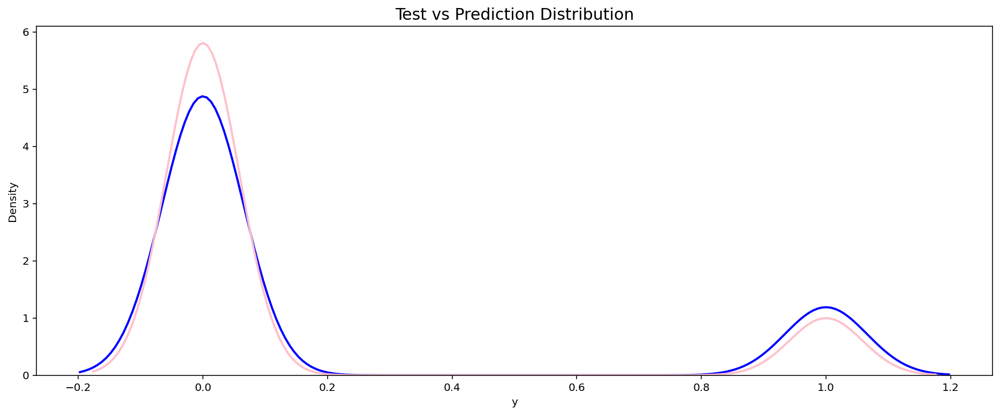

In [90]:
# Calling the function for logistic regression
logistic_regression(X_train,X_test,y_train,y_test)

## Random Forest Classifier Model and Tuning

In [91]:
## Creating Random Forest Model

def random_forest(X_train,X_test,y_train,y_test):
    
    """
    This function create Random Forest Classification model, tuned the parameters 
    for creating better performing model and saved it for future prediction
    
    """
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import GridSearchCV
    import pickle
    rf=RandomForestClassifier()
    
    #Parameter to be tuned
    print("Parmeter to be tuned :{}".format(RandomForestClassifier().get_params().keys))
    
    params={'bootstrap': [True, False],
            'max_features': ['auto', 'log2','sqrt'],
            'n_estimators': [10,50,100]}
    
    grid= GridSearchCV(rf,params,cv=5)
    grid.fit(X_train,y_train)
    y_pred=grid.predict(X_test)
    
    ##
    print("THe best hyperparameter used :{}".format(grid.best_params_))
    
    result=metrics(y_test,y_pred)
    
    # Saving the model
    file =open('RandomForest.pkl','wb')
    pickle.dump(grid,file)

Parmeter to be tuned :<built-in method keys of dict object at 0x000001F91D95CEF8>
THe best hyperparameter used :{'bootstrap': False, 'max_features': 'sqrt', 'n_estimators': 100}

 accuracy:
 
 0.89125

 classification_report: 
 
               precision    recall  f1-score   support

           0       0.88      1.00      0.94      6432
           1       0.99      0.45      0.62      1568

    accuracy                           0.89      8000
   macro avg       0.94      0.72      0.78      8000
weighted avg       0.90      0.89      0.87      8000


 confusion_matrix:
 
[[6426    6]
 [ 864  704]]


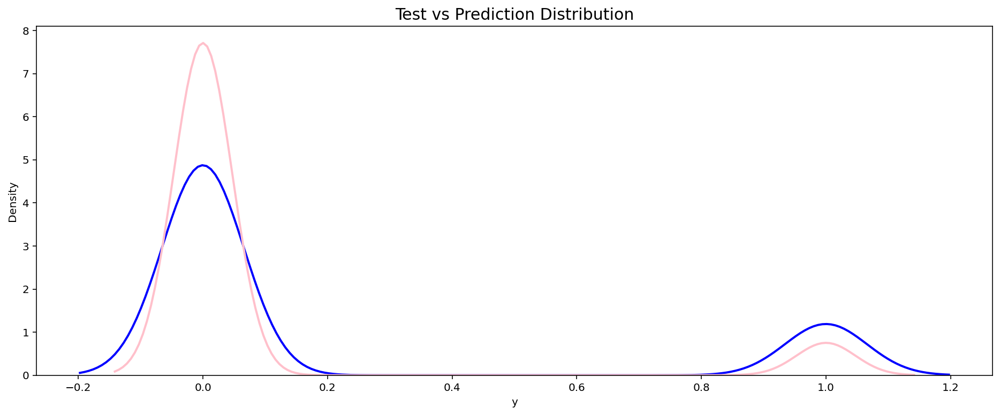

In [92]:
# Calling the function for Random Forest classifier
random_forest(X_train,X_test,y_train,y_test)

In [93]:
# Opening the saved Logistic Regression Model

model=open('LogReg.pkl','rb')
lr_model=pickle.load(model)

In [101]:
# Opening the saved Random Forest model

model=open('RandomForest.pkl','rb')
rf_model=pickle.load(model)

## ROC plot

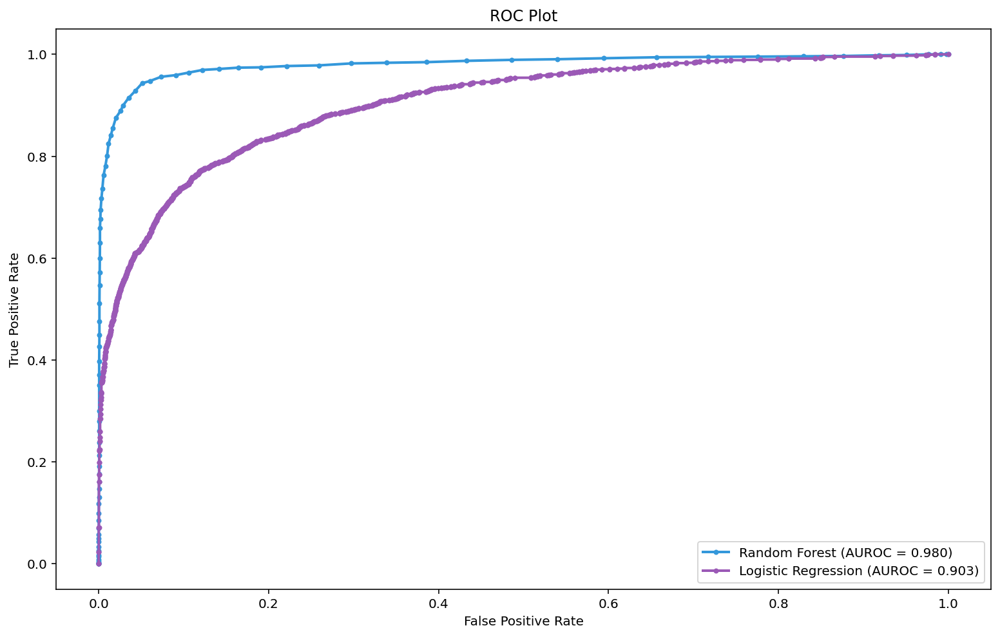

In [124]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculating the prediction probabilites on validation data

rf_probs = rf_model.predict_proba(X_test)
lr_probs = lr_model.predict_proba(X_test)

# Selcting only probabilty for the occurance of 1

rf_probs = rf_probs[:, 1]
lr_probs = lr_probs[:, 1]

# Calculating the auc score for bot the model

rf_auc = roc_auc_score(y_test, rf_probs)
lr_auc = roc_auc_score(y_test, lr_probs)

# Calculating true position rate and false positive score
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)

# Plotting the ROC curve for both the model
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest (AUROC = %0.3f)' % rf_auc)
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic Regression (AUROC = %0.3f)' % lr_auc)

# Title
plt.title('ROC Plot')
# Axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# Show legend
plt.legend() # 
# Show plot
plt.show()

## Prediction on Test Data 

In [133]:
# Predicting the probabilty on test data

result1_lr_probs = lr_model.predict_proba(final_testing_df)
result2_rf_probs = rf_model.predict_proba(final_testing_df)


In [134]:
# Selcting only probabilty for the occurance of 1

result1_lr_probs = result1_lr_probs[:, 1]
result2_rf_probs = result2_rf_probs[:, 1]

In [136]:
# Saving the prediction in result1 file
result1_lr_probs=pd.DataFrame(result1_lr_probs)
result1_lr_probs.to_csv('lr_result1.csv')

In [137]:
# Saving the prediction in result2 file

result2_rf_probs=pd.DataFrame(result2_rf_probs)
result2_rf_probs.to_csv('rf_result2.csv')